<table style="background-color: #FFFF9b; border: dashed; border-width: medium; border-radius: 10px; padding: 10px" align="center">
   <tr style="border: none">
      <th style="border: none"><font face="verdana" size="12" color="black"> 👀 AIC Project 2023-24 👀 </font></th>
   </tr>
   <tr style="border: none">
      <th style="border: none"><font face="verdana" size="4" color="black"> Group 09 </font></th>
   </tr>
   <tr style="border: none">
      <th style="border: none"><font face="verdana" size="3" color="black"> 🎓 Ricciardi Andrea Vincenzo - 0622702009 📚 </font></th>      
   </tr>
   <tr style="border: none">
      <th style="border: none"><font face="verdana" size="3" color="black"> 🎓 Rolando Giovanni - 0622702018 📚 </font></th>
   <tr/>
   <tr style="border: none">
      <th style="border: none"><font face="verdana" size="3" color="black"> 🎓 Zinno Andrea - 0622702064 📚 </font></th>
   <tr/>
</table>

The main goal of this project is to evaluate the robustness of a face recognition-based access control system against adversarial attacks and to explore the possibility of implementing effective defenses.

# **Contents**

1.	[Load prereqs and data ⚙️](#prereqs)
2.  [Dataset Selection 📂](#dataset_selection)
3.  [Accuracy Evaluation of NN1 🎯](#accuracy_evaluation_of_NN1)
4.	[Adversarial Examples Generation 🎭](#adversial_examples_generation)
5.  [Alternative Classifier Testing 🔄](#nn2)
6.  [Transferability 🔄](#transferability)
7.  [Defense Mechanism Implementation 🛡️](#defense)

<a id="prereqs"></a>
# **1. Loading prereqs ⚙️**

Create a new conda environment and install the required packages from requirements.txt.

In [343]:
# Create a new conda environment for the project and install the required packages.
# !conda create -n myenv python=3.9
# !pip install -r requirements.txt

Loading necessary libraries for the project

In [135]:
from imports import *
from utils import *

Defining the constants used throughout the notebook.

In [136]:
# Configure notebook constants
script_dir = os.getcwd() + '\\datasets'

# Dataset constants
dataset_selection = False
vgg2_dataset_annotations_path = script_dir + '\\' + 'identity_meta.csv'

# MTCNN constants 
mtcnn_processing = False

# Test set constants
test_set_folder = script_dir + '\\' + 'TestSet'
test_set_data_folder = test_set_folder + '\\' + 'data'
test_set_annotations_folder = test_set_folder + '\\' + 'test_set.csv'

# Model constants
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

<a id="dataset_selection"></a>
# **2. Dataset Selection 📂**

Choose 100 identities from the training set of the **VGG-Face2** dataset (<a href="https://drive.google.com/file/d/1SXhc8m5PHxyM4lEWVEccSufIa8OiOjGW/view?usp=sharing">link</a>) and construct a test set of at least 1000 images (at least 10 per identity), extracted from the dataset (<a href="https://drive.google.com/file/d/1K56kVYHHDfLA2Anm7ga0tQolMwIPk6R8/view?usp=sharing">link</a>) or found online.

> The dataset contains 3.31 million images of 9131 subjects (identities), with an average of 362.6 images for each subject. Images are downloaded from Google Image Search and have large variations in pose, age, illumination, ethnicity and profession (e.g. actors, athletes, politicians). The VGGFace2 consist of a training set (8631 images) and a validation set (500 images).

In [137]:
# Read the all dataset annotations used to train and test the model (9131 classes - 8631 for training and 500 for testing).
vgg2_dataset = pd.read_csv(
    filepath_or_buffer=vgg2_dataset_annotations_path,   # File path
    sep=',',                                            # Separator
    skipinitialspace=True,                              # Skip spaces after delimiter
    engine='python'                                     # Parser engine
)

# Read the test set created from the original dataset to test the model (100 classes - 10 images per class).
test_set = pd.read_csv(
    filepath_or_buffer=test_set_annotations_folder,     # File path
    sep=',',                                            # Separator
    skipinitialspace=True,                              # Skip spaces after delimiter
    engine='python'                                     # Parser engine
)

# Define the size of the test set.
test_set_size = len(test_set) * 10

# Labels used to train the model (8631 classes).
fpath = tf.keras.utils.get_file(fname = 'rcmalli_vggface_labels_v2.npy',
                                origin = "https://github.com/rcmalli/keras-vggface/releases/download/v2.0/rcmalli_vggface_labels_v2.npy",
                                cache_dir = "./")
LABELS = np.load(fpath)

### Creating the test set

The following script creates the test set from the VGG2-Faces Dataset.

In [347]:
if dataset_selection:

    # Divide the dataset into two datasets: 'male' and 'female'.
    male_dataset = vgg2_dataset[vgg2_dataset['Gender'] == 'm']
    female_dataset = vgg2_dataset[vgg2_dataset['Gender'] == 'f']

    # Create a new folder for the test set if it does not exist.
    if not os.path.exists(test_set_folder):
        os.makedirs(test_set_folder)

    # Create a new dataset with 75 samples (not 50 because the dataset not contains all the classes specified in the 'test_set.csv' file).
    test_set = pd.concat([male_dataset.sample(n=75, replace=False), female_dataset.sample(n=75, replace=False)], sort=False)
    # Save the new dataset.
    vgg2_dataset.to_csv(test_set_annotations_folder, index=False)
    
    # Copy images to the new folder
    for _, row in test_set.iterrows():
        image_id = row['Class_ID']
        image_name = row['Name']
        try:
            # Check if the current folder 'TestSet' contains 100 classes
            if len(os.listdir(test_set_data_folder)) == 100:
                break        
            # Create a new folder for each class
            if not os.path.exists(os.path.join(test_set_data_folder, image_name)):
                os.makedirs(os.path.join(test_set_data_folder, image_name))
            # Copy just ten images from each class to the TestSet folder
            all_images = os.listdir(os.path.join("C:\\Users\\andyv\\Downloads\\AIC_Project\\vggface2_train\\train", image_id))
            for i in range(10):
                shutil.copy(os.path.join("C:\\Users\\andyv\\Downloads\\AIC_Project\\vggface2_train\\train", image_id, all_images[i]), os.path.join(test_set_data_folder, image_name, all_images[i]))
        except Exception as e:
            print("Error: {0}".format(e))

<a id="accuracy_evaluation_of_NN1"></a>
# **3. Accuracy Evaluation of NN1** 🎯

Evaluate the accuracy of the provided face recognition network (henceforth referred to as NN1) on the constructed test set.

### Define the Model (NN1: Inception Resnet V1)

We initialize an **`Inception Resnet V1`** model for face recognition. The Inception Resnet V1 is a convolutional neural network (CNN) architecture that's been trained for face recognition. It's being imported from the `facenet_pytorch` library. The model is being initialized with pre-trained weights from the `vggface2` dataset, which is a large-scale face recognition dataset. The `.eval()` method is called to set the model in evaluation mode, which means it won't change the weights while making predictions.

Finally, `resnet.classify = True` is setting the model to classification mode, which means it will return logits (the raw, non-normalized output of the last layer in the network) when making predictions.

In [138]:
from facenet_pytorch import InceptionResnetV1

# Initialize the Inception Resnet V1 model for face recognition
nn1 = InceptionResnetV1(pretrained='vggface2').eval().to(device)
nn1.classify = True                                                          # Enable classification mode (return logits)

### Define the ``MTCNN`` (Multi-task Cascaded Convolutional Networks)

The **`MTCNN`** (Multi-task Cascaded Convolutional Networks) is an advanced deep learning framework used primarily for face detection and alignment in unconstrained environments. The complexity of these tasks arises from the variability in poses, illumination conditions, and potential occlusions. The `MTCNN` framework is particularly effective due to its multi-stage approach and the ability to exploit the correlations between face detection and facial landmark localization.

> **How `MTCNN` Works?** 
>
> `MTCNN` employs a *cascaded structure* composed of three stages of convolutional networks. Each stage is designed to progressively refine the detection and alignment process in a coarse-to-fine manner. This structure enables the network to efficiently handle the face detection and alignment tasks. Three Stages: 
> - **Stage 1**: Quickly proposes candidate windows that might contain faces.
> - **Stage 2**: Refines these candidate windows and rejects non-face regions, further narrowing down the search area.
> - **Stage 3**: Precisely locates the facial landmarks within the retained regions to ensure accurate alignment.

When used as part of a face recognition pipeline, such as with the InceptionResnetV1 model, `MTCNN` provides several advantages:

- **Face Detection and Preprocessing**: By directly feeding images to an `MTCNN` object in `facenet-pytorch`, the module returns *torch tensors* containing the detected faces rather than just bounding boxes. This integration allows for seamless processing of faces, which can be directly used as input for further recognition steps.

- **Image Standardization**: `MTCNN` applies fixed image standardization to faces before returning them. This standardization ensures that the input faces are appropriately preprocessed for optimal performance with the face recognition model, such as `InceptionResnetV1`. However, if needed, this normalization can be disabled by setting `post_process=False` when creating the detector, resulting in output images that are more visually normal.

- **Ease of Use**: The direct output of detected faces as tensors simplifies the pipeline, making it easier to integrate `MTCNN` as the initial stage of face recognition workflows. The preprocessed faces can be efficiently passed to subsequent networks or algorithms, streamlining the entire recognition process.

In [139]:
from facenet_pytorch import MTCNN

# Initialize the MTCNN model for face detection
mtcnn = MTCNN(
    image_size=160,                             # Image size (default: 160) for the model
    margin=0,                                   # Margin (default: 0) for the bounding box around the face
    min_face_size=20,                           # Minimum face size (default: 20) to detect
    thresholds=[0.6, 0.7, 0.7],                 # Thresholds (default: [0.6, 0.7, 0.7]) for the MTCNN
    factor=0.709,                               # Factor used to create a scaling pyramid of face sizes (default: {0.709})
    post_process=True,                          # Post-process (default: True) the MTCNN model in order to align faces
    select_largest=True,                        # Select the largest face in the image (default: True)
    selection_method="center_weighted_size",    # Which heuristic to use for selection (Default None)
    keep_all=False,                             # Keep all faces (default: False) found in the image
    device=device                               # Device (default: 'cuda') to use for the MTCNN model
)

### Define a DataLoader for Test Set

The following scripts prepare a dataset for input into a Pytorch model and creating a DataLoader to handle batching of the data. 
Here's a step-by-step explanation:

1. It defines a function `collate_fn(x)` that takes a batch of data and returns the first element. This function will be used to process batches of data from the DataLoader.

2. It sets up a series of transformations to apply to the images in the dataset. These transformations will be applied to each image as it's loaded. The transformations include resizing the images to 160x160 and converting the images to PyTorch tensors.

3. It loads a dataset from a folder of images. The `ImageFolder` function automatically labels the images based on the structure of the directory.

4. It modifies the class labels in the dataset. The `idx_to_class` attribute of the dataset is a dictionary that maps numerical class IDs to their corresponding class names. The code replaces any double quotes in the class names with nothing, effectively removing them.

5. Finally, it creates a DataLoader with the dataset. The DataLoader handles batching of the data and provides an iterable over the batches. The `collate_fn` argument is set to the function defined earlier, and `num_workers` is set to 0, which means the data loading will be done in the main process

In [140]:
# Define the collate function for the DataLoader
def collate_fn(x):
    return x[0]

# Define the transforms for the DataLoader
transforms = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
])

# Create a DataLoader for the test set by using the ImageFolder dataset
dataset = datasets.ImageFolder(root=test_set_data_folder, transform=transforms if not mtcnn_processing else None)
dataset.idx_to_class = {i: " " + c.replace('"', '') for i, c in enumerate(test_set['Name'])}
dataloader = DataLoader(dataset, collate_fn=collate_fn, num_workers=0)

# Get x_test and y_test from the DataLoader
x_test, y_test = zip(*[(sample[0], sample[1]) for sample in dataloader])
x_test = torch.stack(x_test)                                                                    # Stack the images into a single tensor

### Perfom MTCNN Facial Detection

Iterate through the DataLoader object and detect faces and associated detection probabilities for each. The `MTCNN` forward method returns images cropped to the detected face, if a face was detected. By default only a single detected face is returned - to have MTCNN return all detected faces, set `keep_all=True` when creating the MTCNN object above.

In [ ]:
if mtcnn_processing:
    # Use the MTCNN model to detect faces in the images
    x_test_aligned = list()
    y_test_aligned = list()
    for i, (x, y) in enumerate(dataloader):
        x_aligned = mtcnn(x, return_prob=False)
        if x_aligned is not None:
            x_test_aligned.append(x_aligned)
            y_test_aligned.append(y)
        else:
            logger.info(f'Face not detected in image {i}')

    # Stack the aligned images into a single tensor
    x_test_aligned = torch.stack(x_test_aligned)
    y_test_aligned = torch.tensor(y_test_aligned)

    # Save the aligned images and labels
    torch.save(x_test_aligned, 'x_test_aligned.pt')
    torch.save(y_test_aligned, 'y_test_aligned.pt')

    # Create a new DataLoader for the aligned images
    dataloader_aligned = DataLoader(TensorDataset(x_test_aligned, y_test_aligned), collate_fn=collate_fn)
    dataloader_aligned.dataset.idx_to_class = dataset.idx_to_class

    # Save the aligned DataLoader
    torch.save(dataloader_aligned, 'dataloader_aligned.pt')

### Load the Aligned Images and Labels (and DataLoader)

In this section, we get the aligned images and labels from the saved files and load the aligned DataLoader. 

In [221]:
# Load the aligned DataLoader
dataloader_aligned = torch.load('dataloader_aligned.pt')

# Get the x_test_aligned and y_test_aligned from the DataLoader
x_test_aligned, y_test_aligned = zip(*[(sample[0], sample[1]) for sample in dataloader_aligned])

# Convert the aligned images and labels to tensors
x_test_aligned = torch.stack(x_test_aligned).numpy()
y_test_aligned = torch.tensor(y_test_aligned)

### Evaluate the Test Set on the NN1

After aligning the faces with the `MTCNN` model, we can proceed to evaluate the model on the test set. In particular, we will evaluate the model on the test set and calculate the accuracy of the model. By comparing the true and predicted labels, we can calculate the accuracy of the model on the test set. Having aligned the faces, the performance of the model should be improved.


In [224]:
# Flag to evaluate the model (False: the nn1 model has been already evaluated)
evaluate_nn1 = False

# Stop the execution if the nn1 model has been already evaluated (evaluate_nn1 = False)
if not evaluate_nn1:
    raise SystemExit

# Get the embeddings for the test set
y_true, y_pred = evaluate_model(nn1, dataloader_aligned, LABELS)

# Save the embeddings for the test set
torch.save(y_true, 'y_true.pt')
torch.save(y_pred, 'y_pred.pt')

SystemExit: 

[INFO] Accuracy: 0.992
[INFO] Original test data (1000 images):        
 • Correctly classified: 992        
 • Incorrectly classified: 8


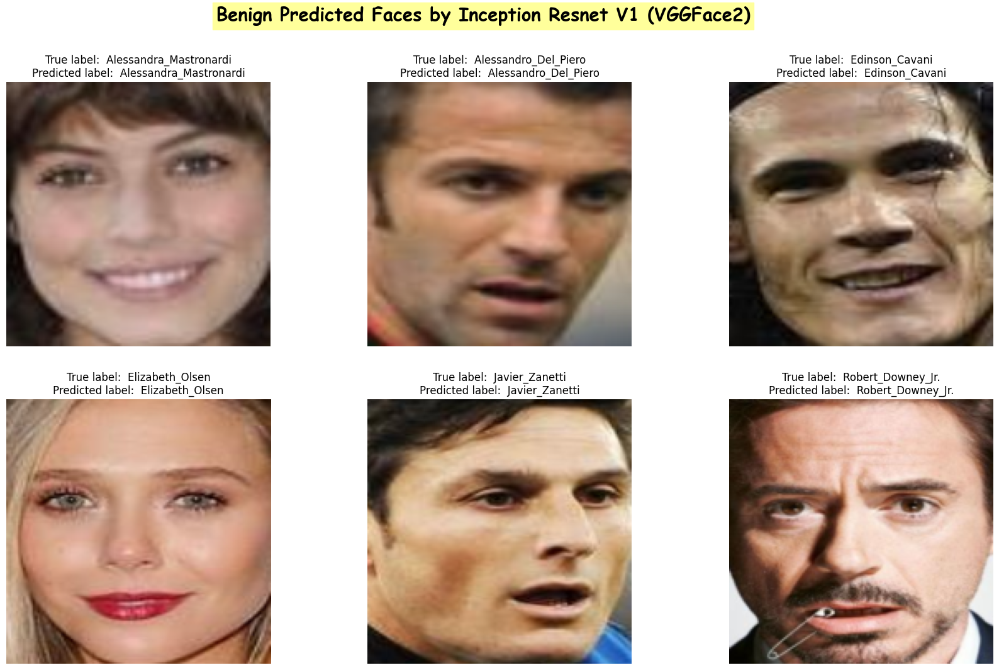

In [225]:
# Load the embeddings for the test set
y_true = torch.load('y_true.pt')
y_pred = torch.load('y_pred.pt')

# Plot the predictions for some samples of the test set
plot_predicted_images(x_test=x_test_aligned, y_true=y_true, y_pred=y_pred, title="Benign Predicted Faces by Inception Resnet V1 (VGGFace2)")

# Calculate the accuracy of the model
accuracy_nn1 = accuracy_score(y_true, y_pred)
logger.info("Accuracy: {0}".format(accuracy_nn1))

# Get the number of correctly classified images
nb_correct_pred = np.sum(np.array(y_true) == np.array(y_pred))

logger.info("Original test data (1000 images):\
        \n • Correctly classified: {0}\
        \n • Incorrectly classified: {1}".format(nb_correct_pred, test_set_size - nb_correct_pred)
)

<a id = "adversial_examples_generation"></a>
# **4. Adversarial Examples Generation 🎭**

In this segment, we delve into the intriguing realm of adversarial attacks in machine learning models. **Adversarial examples 🎭** are crafted inputs intentionally designed to deceive models, leading to erroneous predictions. Understanding the generation and implications of adversarial examples is crucial for fortifying machine learning systems against potential vulnerabilities.

In the following script, we employ the powerful tools provided by the `Adversarial Robustness Toolbox (ART)` to explore the generation of adversarial examples. Leveraging the `ARTAttackWrapper`, we showcase the process of crafting adversarial inputs for a PyTorch classifier, specifically utilizing the `Inception ResNet V1 model` (NN1).

We focus on the implementation and evaluation of several attack techniques, each aimed at probing the robustness of the PyTorch classifier:

1. **Fast Gradient Sign Method (bim)**: This technique perturbs the input data by adding small, carefully crafted perturbations scaled by the sign of the gradient of the loss function with respect to the input. Despite its simplicity, bim often achieves effective adversarial perturbations.

2. **Basic Iterative Method (BIM)**: BIM is an iterative variant of the bim attack. It applies multiple small perturbations to the input data, each time computing the gradient of the loss function with respect to the perturbed input. By iteratively refining the perturbations, BIM enhances the effectiveness of the attack.

3. **Projected Gradient Descent (PGD)**: Unlike bim, PGD conducts a more sophisticated iterative optimization process. It iteratively applies bim with a smaller step size within a specified epsilon ball around the original input, ensuring that the perturbed data remains within a permissible range.

4. **DeepFool**: DeepFool is an iterative technique that aims to find the minimal perturbation required to mislead the classifier. By iteratively linearizing the decision boundaries of the model, DeepFool computes perturbations that cause misclassification with minimal changes to the input.

5. **Carlini & Wagner (C&W) Attack**: The C&W Attack formulates the generation of adversarial examples as an optimization problem, aiming to find the smallest perturbation that leads to misclassification while adhering to certain constraints. It offers strong adversarial perturbations capable of evading detection.


In [144]:
from art.estimators.classification import PyTorchClassifier
from attacks.artattackwrapper import ARTAttackWrapper

# Initialize the classifier with the Inception Resnet V1 model
classifier = PyTorchClassifier(
    model=nn1,                                                     # The PyTorch model to use
    clip_values=(-1, 1),                                           # The minimum and maximum values of the input                        
    loss=nn.CrossEntropyLoss(),                                    # The loss function
    optimizer=optim.Adam(nn1.parameters(), lr=0.01),               # The optimizer
    input_shape=(3, 160, 160),                                     # The shape of the input
    nb_classes=LABELS.size,                                        # The number of classes
)

# Initialize the ART wrapper
attacks = ARTAttackWrapper(classifier)

# Save the classifier and the ART wrapper
save = False
if save:
    torch.save(classifier, 'classifier.pt')
    torch.save(attacks, 'attacks.pt')

### Target Image

This code snippet sets up an adversarial attack by selecting a target class (in this case, Andrew Lincoln"), obtaining the prediction probability of the target class by the NN1, and then crafting a target label for the attack.

[INFO] Clean Images correctly classified as Andrew_Lincoln (Target Class): 10


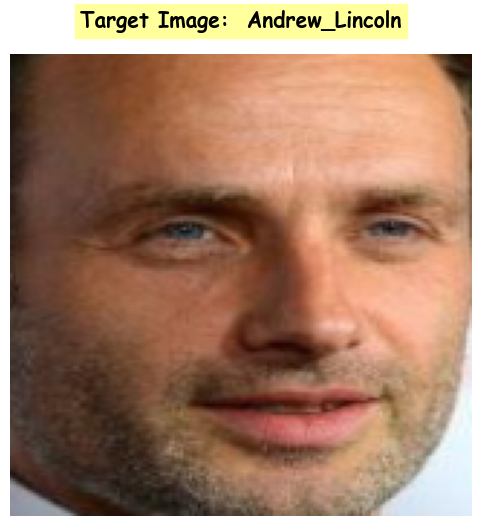

In [145]:
# Target class
target_class = 498                                                              # Andrew Lincoln (dataloader.dataset.idx_to_class[15])
# Target Image
target_probs = nn1(torch.tensor(x_test_aligned[152]).unsqueeze(0).to(device))
# Target Prediction
pred_class = int(torch.argmax(target_probs, dim=1).item())  
# Target Label
targeted_label = target_class * np.ones(1)

# One-hot encoding of the target label
one_hot_targeted_label = tf.keras.utils.to_categorical(targeted_label, num_classes = len(LABELS))
# Repeat the one-hot encoding for the batch size (1 -> 1000)
batch_size = len(x_test_aligned)
one_hot_targeted_label = np.tile(one_hot_targeted_label, (batch_size, 1))

# Get the number of clean images correctly classified as the target class (Andrew Lincoln)
nb_correct_pred_target = np.sum(np.array(y_true) == LABELS[target_class])
logger.info("Clean Images correctly classified as{} (Target Class): {}".format(LABELS[target_class], nb_correct_pred_target))

# Plot the target image
fig = plt.figure(figsize=(6, 6))
image = ((x_test_aligned[152] + 1) / 2).transpose(1, 2, 0)
np.clip(image, 0, 1, out=image)
plt.imshow(image)
plt.title('Target Image: {0}'.format(LABELS[pred_class]), fontsize=15, color='black', backgroundcolor='#FFFF9b', fontweight='bold', fontname='Comic Sans MS', pad = 20)
plt.axis('off')
plt.show()

## **FGSM**

In [146]:
fgsm_generate = False

#### Error Generic

We employ a **non-targeted attack** (error-generic). The focus is on crafting adversarial examples without a specific target in mind. The objective is to generate perturbations on the input data that cause misclassification across various classes without prioritizing any particular outcome.

In [147]:
# FGSM parameters
fgsm_parameters = {
    "eps": 10/255,                             # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
}

# Stop the execution of the code if the adversarial examples are already generated (fgsm_generate = False)
if not fgsm_generate:
    raise SystemExit

# Generate adversarial examples using the Fast Gradient Sign Method (FGSM)
x_test_adv_fgsm_g = attacks.fgsm_attack(x_test_aligned, **fgsm_parameters)
y_test_adv_fgsm_g = LABELS[np.argmax(classifier.predict(x_test_adv_fgsm_g), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_fgsm_g, 'attacks/FGSM/x_test_adv_fgsm_g.pt')
torch.save(y_test_adv_fgsm_g, 'attacks/FGSM/y_test_adv_fgsm_g.pt')

SystemExit: 

[INFO] Accuracy FGSM: 0.175
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 175        
 	 • Incorrectly classified: 825
[INFO] Perturbation FGSM: 0.03760808706283569


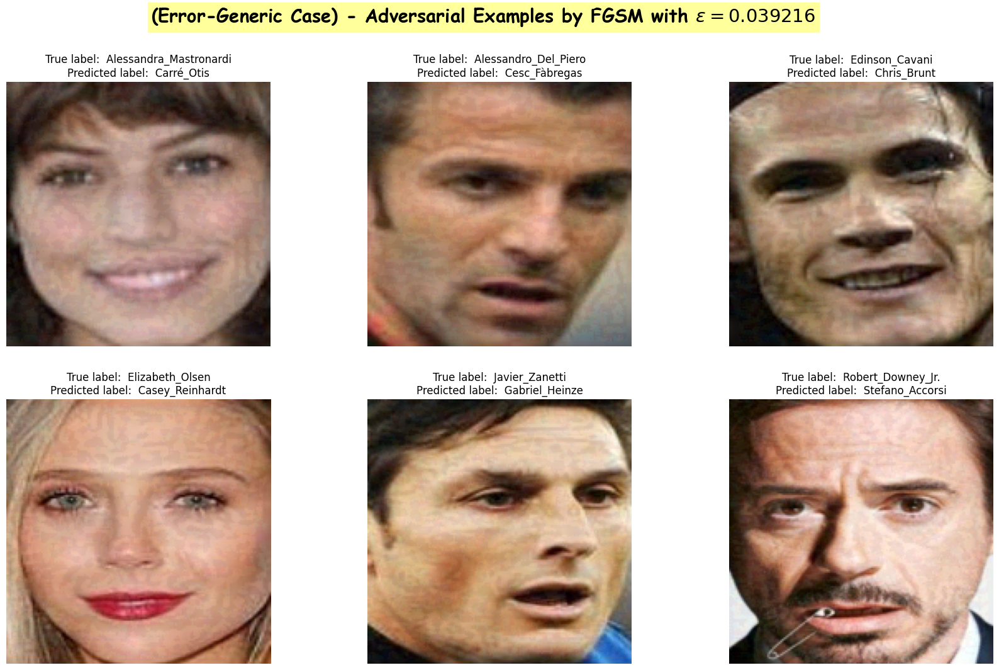

In [148]:
# Load the adversarial examples and labels
x_test_adv_fgsm_g = torch.load('attacks/FGSM/Generic/x_test_adv_nn1_g_{}.pt'.format(fgsm_parameters['eps']))
y_test_adv_fgsm_g = LABELS[np.argmax(classifier.predict(x_test_adv_fgsm_g), axis=1)]

# Plot the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
plot_predicted_images(x_test=x_test_adv_fgsm_g, y_true=y_true, y_pred=y_test_adv_fgsm_g, title="(Error-Generic Case) - Adversarial Examples by FGSM with $\epsilon = {:2f}$".format(fgsm_parameters["eps"]))

# Get the accuracy of the model on the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
accuracy_fgsm = accuracy_score(y_true, y_test_adv_fgsm_g)
logger.info("Accuracy FGSM: {0}".format(accuracy_fgsm))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_fgsm_g))
# 
logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}".format(nb_correct_adv_pred, test_set_size - nb_correct_adv_pred)
)

# Get the perturbation for the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
perturbation_fgsm = np.mean(np.abs(x_test_adv_fgsm_g - x_test_aligned))
logger.info("Perturbation FGSM: {0}".format(perturbation_fgsm))

#### Error Specific

We employ a **targeted attack** (error-specific). The focus is on crafting adversarial examples in order to manipulate the model's predictions in a targeted manner, directing misclassifications towards a specific class or set of classes.

In [149]:
## HyperParameters
fgsm_parameters = {
    "eps": 25/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "targeted": True
}

# Stop the execution of the code if the adversarial examples are already generated (fgsm_generate = False)
if not fgsm_generate:
    raise SystemExit

x_test_adv_fgsm_s = attacks.fgsm_attack(x_test_aligned, one_hot_targeted_label, **fgsm_parameters)
y_test_adv_fgsm_s = LABELS[np.argmax(classifier.predict(x_test_adv_fgsm_s), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_fgsm_s, 'attacks/FGSM/x_test_adv_fgsm_s.pt')
torch.save(y_test_adv_fgsm_s, 'attacks/FGSM/y_test_adv_fgsm_s.pt')

SystemExit: 

[INFO] Accuracy FGSM: 0.106
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 106        
 	 • Incorrectly classified: 894        
 	 • Correctly classified as Andrew_Lincoln: 257        
 	 • Incorrectly classifed as Andrew_Lincoln: 743
[INFO] Perturbation FGSM: 0.09352799504995346


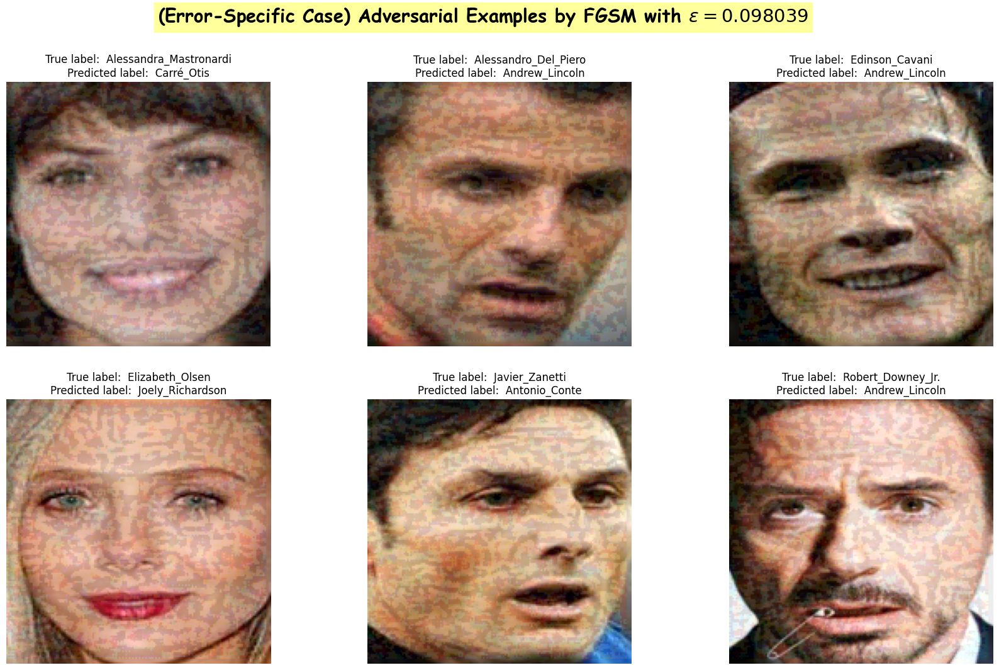

In [150]:
# Load the adversarial examples and labels
x_test_adv_fgsm_s = torch.load('attacks/FGSM/Specific/x_test_adv_nn1_s_{}.pt'.format(fgsm_parameters['eps']))
y_test_adv_fgsm_s = LABELS[np.argmax(classifier.predict(x_test_adv_fgsm_s), axis=1)]

# Plot the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
plot_predicted_images(x_test=x_test_adv_fgsm_s, y_true=y_true, y_pred=y_test_adv_fgsm_s, title="(Error-Specific Case) Adversarial Examples by FGSM with $\epsilon = {:2f}$".format(fgsm_parameters["eps"]))

# Get the accuracy of the model on the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
accuracy_fgsm = accuracy_score(y_true, y_test_adv_fgsm_s)
logger.info("Accuracy FGSM: {0}".format(accuracy_fgsm))

# Get the number of correctly classified images and the number of correctly classified images as the target class
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_fgsm_s))
nb_correct_adv_pred_target = np.sum(np.array(y_test_adv_fgsm_s) == np.tile(LABELS[target_class], test_set_size))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}\
        \n \t • Correctly classified as{2}: {3}\
        \n \t • Incorrectly classifed as{4}: {5}".format(
                nb_correct_adv_pred, test_set_size - nb_correct_adv_pred,\
                LABELS[target_class], nb_correct_adv_pred_target, 
                LABELS[target_class], test_set_size - nb_correct_adv_pred_target                
        )
)

# Get the perturbation for the adversarial examples generated using the Fast Gradient Sign Method (FGSM)
perturbation_fgsm = np.mean(np.abs(x_test_adv_fgsm_s - x_test_aligned))
logger.info("Perturbation FGSM: {0}".format(perturbation_fgsm))

#### Security Evaluation Curve

In [151]:
# Set the flag to False if the adversarial examples are already generated
fgsm_generate = False

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not fgsm_generate:
    raise SystemExit

# Epsilon Range for the FGSM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Evaluating the model for each epsilon value"):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = attacks.fgsm_attack(x_test_aligned, eps=eps, targeted=False)
    torch.save(x_test_adv, 'attacks/FGSM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_fgsm = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_fgsm))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Evaluating the model for each epsilon value"):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = attacks.fgsm_attack(x_test_aligned, one_hot_targeted_label, eps=eps, targeted=True)
    torch.save(x_test_adv, 'attacks/FGSM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_fgsm = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_fgsm))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/FGSM/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/FGSM/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/FGSM/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/FGSM/perturbation_nn1_s.pt')

SystemExit: 

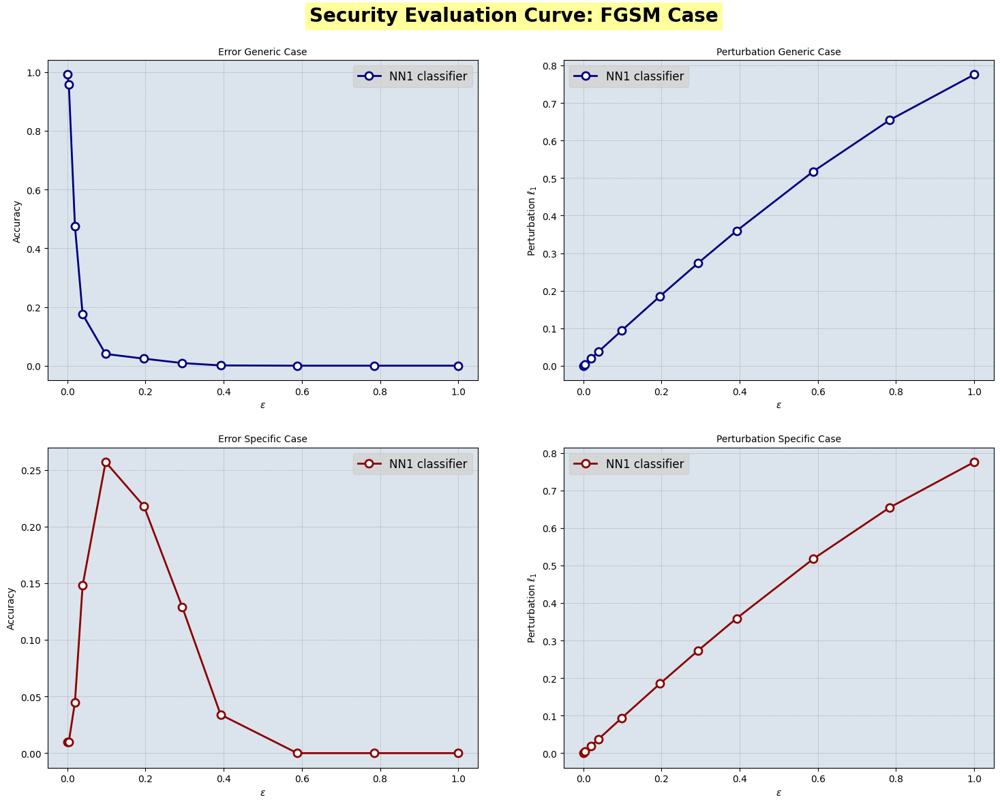

In [152]:
# Define the epsilon range for the FGSM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/FGSM/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/FGSM/perturbation_nn1_s.pt')

security_evaluation_curves(eps_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "FGSM")

## **BIM**

In [153]:
bim_generate = False

#### Error Generic

We employ a **non-targeted attack** (error-generic). The focus is on crafting adversarial examples without a specific target in mind. The objective is to generate perturbations on the input data that cause misclassification across various classes without prioritizing any particular outcome.

In [154]:
## HyperParameters
bim_parameters = {
    "eps": 5/255,                          # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                     # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                        # @param {type:"slider", min:5, max:1e2, step:1}
}

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit
    
# Generate adversarial examples using the Basic Iterative Method (BIM)
x_test_adv_bim_g = attacks.bim_attack(x_test_aligned, **bim_parameters)
y_test_adv_bim_g = LABELS[np.argmax(classifier.predict(x_test_adv_bim_g), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_bim_g, 'attacks/BIM/x_test_adv_bim_g.pt')
torch.save(y_test_adv_bim_g, 'attacks/BIM/y_test_adv_bim_g.pt')

SystemExit: 

[INFO] Accuracy BIM: 0.005
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 5        
 	 • Incorrectly classified: 995
[INFO] Perturbation BIM: 0.01642976514995098


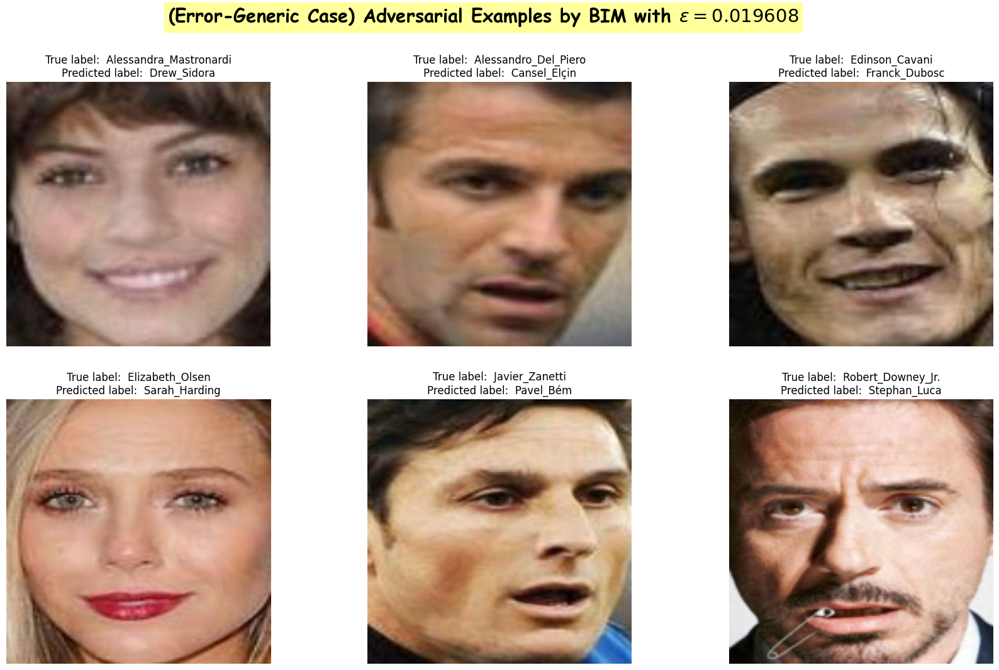

In [155]:
# Load the adversarial examples and labels
if not bim_generate:
    eps = 5/255
    x_test_adv_bim_g = torch.load('attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    y_test_adv_bim_g = LABELS[np.argmax(classifier.predict(x_test_adv_bim_g), axis=1)]

# Plot the adversarial examples generated using the Fast Gradient Sign Method (BIM)
plot_predicted_images(x_test=x_test_adv_bim_g, y_true=y_true, y_pred=y_test_adv_bim_g, title="(Error-Generic Case) Adversarial Examples by BIM with $\epsilon = {:2f}$".format(bim_parameters["eps"]))

# Get the accuracy of the model on the adversarial examples generated using the Fast Gradient Sign Method (BIM)
accuracy_bim = accuracy_score(y_true, y_test_adv_bim_g)
logger.info("Accuracy BIM: {0}".format(accuracy_bim))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_bim_g))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}".format(nb_correct_adv_pred, test_set_size - nb_correct_adv_pred)
)

# Get the perturbation for the adversarial examples generated using the Fast Gradient Sign Method (BIM)
perturbation_bim = np.mean(np.abs(x_test_adv_bim_g- x_test_aligned))
logger.info("Perturbation BIM: {0}".format(perturbation_bim))

#### Error Specific

We employ a **targeted attack** (error-specific). The focus is on crafting adversarial examples in order to manipulate the model's predictions in a targeted manner, directing misclassifications towards a specific class or set of classes.

In [156]:
## HyperParameters
bim_parameters = {
    "eps": 10/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                        # @param {type:"slider", min:5, max:1e2, step:1}
    "targeted": True
}

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit

# Generate adversarial examples using the Basic Iterative Method (BIM)
x_test_adv_bim_s = attacks.bim_attack(x_test_aligned, one_hot_targeted_label, **bim_parameters)
y_test_adv_bim_s = LABELS[np.argmax(classifier.predict(x_test_adv_bim_s), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_bim_s, 'attacks/BIM/x_test_adv_bim_s.pt')
torch.save(y_test_adv_bim_s, 'attacks/BIM/y_test_adv_bim_s.pt')

SystemExit: 

[INFO] Accuracy BIM: 0.005
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 5        
 	 • Incorrectly classified: 995        
 	 • Correctly classified as Andrew_Lincoln: 0        
 	 • Incorrectly classifed as Andrew_Lincoln: 1000
[INFO] Perturbation BIM: 0.02732320874929428


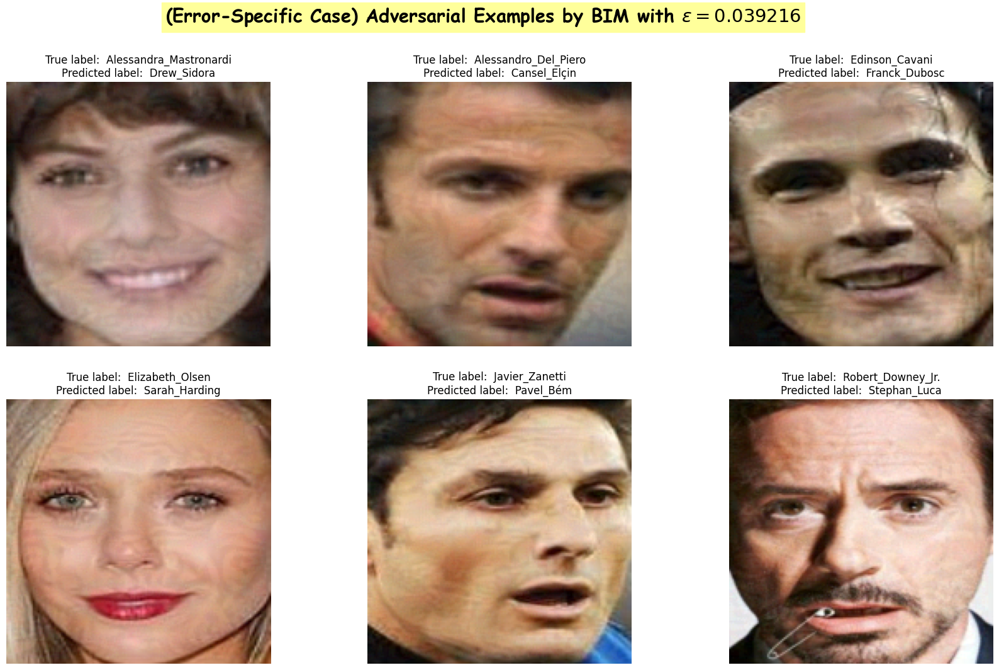

In [158]:
# Load the adversarial examples and labels
if not bim_generate:
    eps = 10/255
    x_test_adv_bim_s = torch.load('attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    y_test_adv_bim_s = LABELS[np.argmax(classifier.predict(x_test_adv_bim_g), axis=1)]

# Plot the adversarial examples generated using the BIM Attack
plot_predicted_images(x_test=x_test_adv_bim_s, y_true=y_true, y_pred=y_test_adv_bim_s, title="(Error-Specific Case) Adversarial Examples by BIM with $\epsilon = {:2f}$".format(bim_parameters["eps"]))

# Get the accuracy of the model on the adversarial examples generated using the BIM Attack
accuracy_bim = accuracy_score(y_true, y_test_adv_bim_s)
logger.info("Accuracy BIM: {0}".format(accuracy_bim))

# Get the number of correctly classified images and the number of correctly classified images as the target class
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_bim_s))
nb_correct_adv_pred_target = np.sum(np.array(y_test_adv_bim_s) == np.tile(LABELS[target_class], test_set_size))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}\
        \n \t • Correctly classified as{2}: {3}\
        \n \t • Incorrectly classifed as{4}: {5}".format(
                nb_correct_adv_pred, test_set_size - nb_correct_adv_pred,\
                LABELS[target_class], nb_correct_adv_pred_target, 
                LABELS[target_class], test_set_size - nb_correct_adv_pred_target                
        )
)

# Get the perturbation for the adversarial examples generated using the BIM Attack
perturbation_bim = np.mean(np.abs(x_test_adv_bim_s - x_test_aligned))
logger.info("Perturbation BIM: {0}".format(perturbation_bim))

#### Security Evaluation Curve

In order to determine the optimal **epsilon** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the epsilon values. Through this evaluation, we identified the epsilon values that yielded the highest performance metrics. A value of epsilon in the range `[5/255, 10/255]` is good enough for both models.

In [159]:
# Set the flag to False if the adversarial examples are already generated
bim_generate = False

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit

# HyperParameters
# --------------
bim_parameters = {
    "eps": 5/255,                          # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                     # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                        # @param {type:"slider", min:5, max:1e2, step:1}
}

# Epsilon Range for the BIM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Error Generic Case
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Evaluating the model for each epsilon value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['eps'] = eps
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, **bim_parameters)
    torch.save(x_test_adv, 'attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Error Specific Case
# -------------------
bim_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Evaluating the model for each epsilon value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['eps'] = eps
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, one_hot_targeted_label, **bim_parameters)
    torch.save(x_test_adv, 'attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/BIM/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/BIM/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/BIM/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/BIM/perturbation_nn1_s.pt')

SystemExit: 

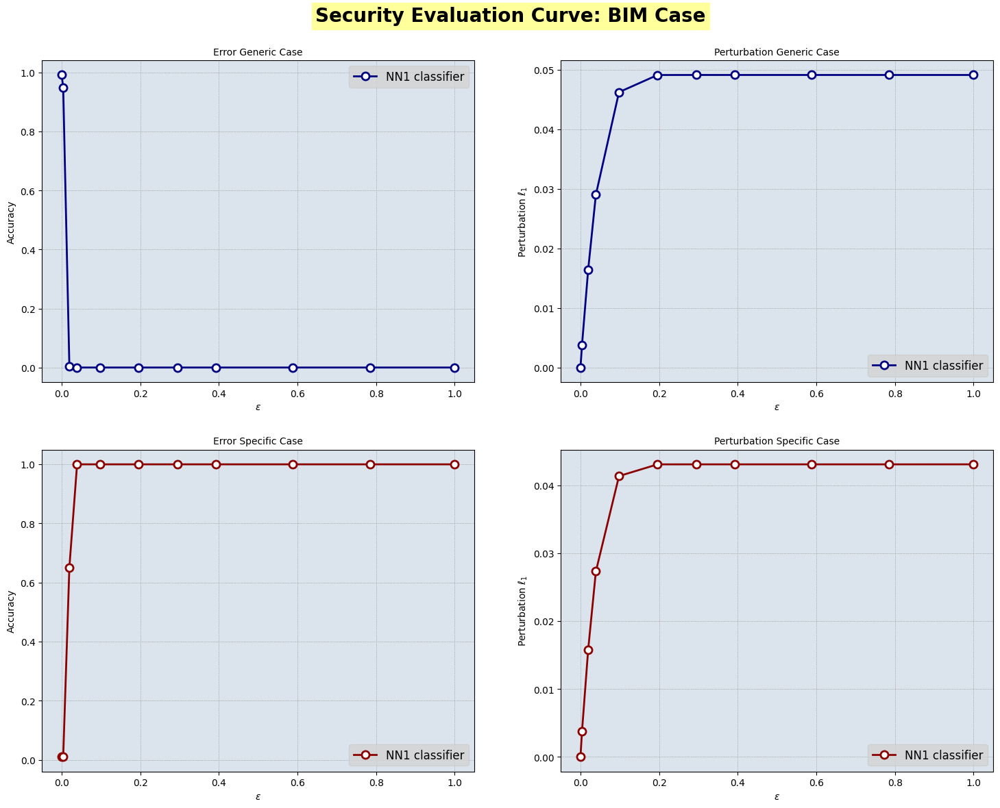

In [160]:
# Define the epsilon range for the BIM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/BIM/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/BIM/perturbation_nn1_s.pt')

security_evaluation_curves(eps_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "BIM")

In order to determine the optimal **epsilon step** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the epsilon step values. Through this evaluation, we identified the epsilon step values that yielded the highest performance metrics. A value of `eps_step = 2/255 ` is good enough for both models.

In [161]:
# Set the flag to False if the adversarial examples are already generated
bim_generate = False

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit

# HyperParameters
# --------------
bim_parameters = {
    "eps": 5/255,                          # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                     # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                        # @param {type:"slider", min:5, max:1e2, step:1}
}

# Epsilon Range for the BIM attack
eps_step_range = [0, 0.1/255, 0.5/255, 1/255, 3/255, 5/255, 10/255]

# Error Generic Case
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_step_range[1:], desc="(Error Generic) Evaluating the model for each epsilon value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['eps_step'] = eps
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, **bim_parameters)
    # torch.save(x_test_adv, 'attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Error Specific Case
# -------------------
bim_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_step_range[1:], desc="(Error Specific) Evaluating the model for each epsilon value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['eps_step'] = eps
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, one_hot_targeted_label, **bim_parameters)
    # torch.save(x_test_adv, 'attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/BIM/eps_range/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/BIM/eps_range/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/BIM/eps_range/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/BIM/eps_range/perturbation_nn1_s.pt')

SystemExit: 

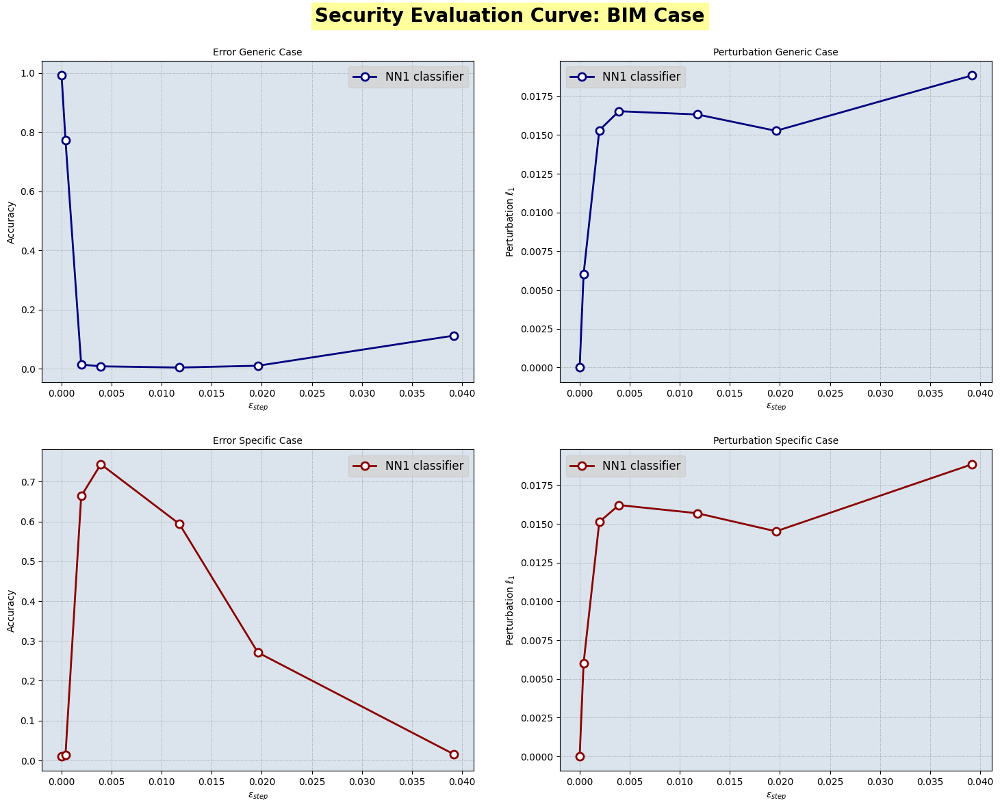

In [162]:
# Define the epsilon range for the BIM attack
eps_step_range = [0, 0.1/255, 0.5/255, 1/255, 3/255, 5/255, 10/255]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/BIM/eps_range/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/BIM/eps_range/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/BIM/eps_range/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/BIM/eps_range/perturbation_nn1_s.pt')

security_evaluation_curves(eps_step_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "BIM", '$\epsilon_{step}$')

In order to determine the optimal **max_iter** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the maximum iteration values. Through this evaluation, we identified the max_iter values that yielded the highest performance metrics. A value of `max_iter = 20 ` is good enough for both models.

In [163]:
# Set the flag to False if the adversarial examples are already generated
bim_generate = False

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit

# HyperParameters
# --------------
bim_parameters = {
    "eps": 5/255,                          # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                     # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                        # @param {type:"slider", min:5, max:1e2, step:1}
}

# Epsilon Range for the BIM attack
max_iter_range = [0, 1, 2, 5, 10, 20, 50]

# Error Generic Case
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for iter_value in tqdm(max_iter_range[1:], desc="(Error Generic) Evaluating the model for each max_iter value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['max_iter'] = iter_value
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, **bim_parameters)
    # torch.save(x_test_adv, 'attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(iter_value))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Error Specific Case
# -------------------
bim_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for iter_value in tqdm(max_iter_range[1:], desc="(Error Specific) Evaluating the model for each max_iter value", leave=False):
    # Change the bim_parameters dictionary to the current epsilon value
    bim_parameters['max_iter'] = iter_value
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = attacks.bim_attack(x_test_aligned, one_hot_targeted_label, **bim_parameters)
    # torch.save(x_test_adv, 'attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(iter_value))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_bim))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/BIM/max_iter/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/BIM/max_iter/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/BIM/max_iter/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/BIM/max_iter/perturbation_nn1_s.pt')

SystemExit: 

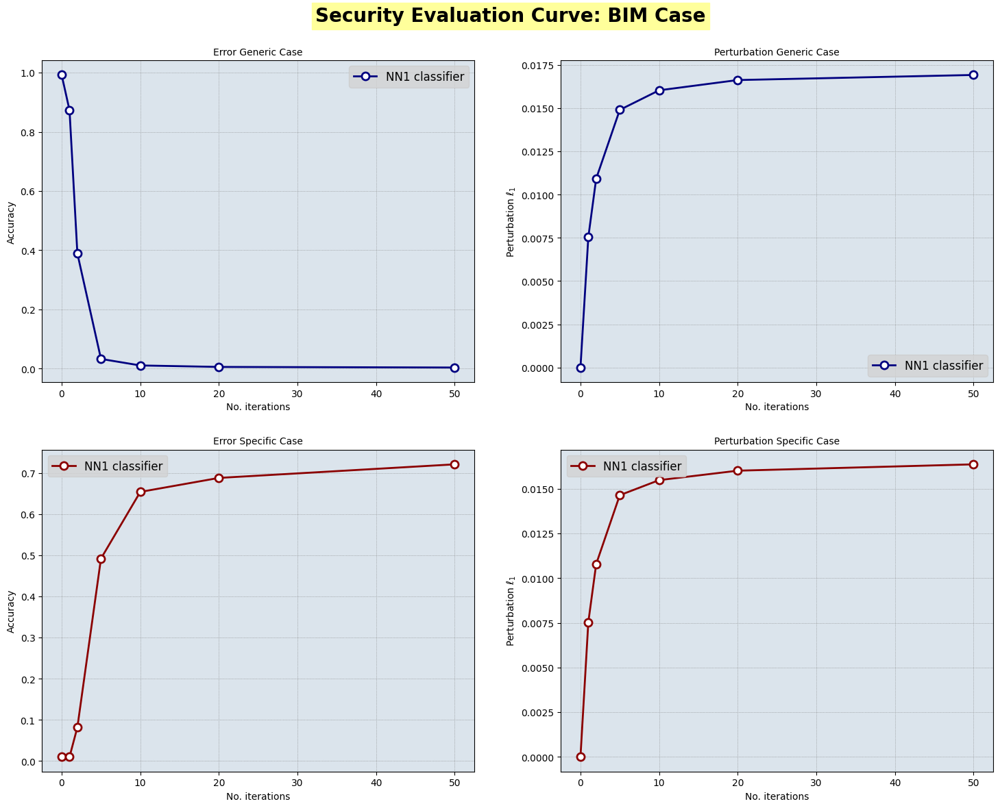

In [164]:
# Define the epsilon range for the BIM attack
max_iter_range = [0, 1, 2, 5, 10, 20, 50]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/BIM/max_iter_range/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/BIM/max_iter_range/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/BIM/max_iter_range/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/BIM/max_iter_range/perturbation_nn1_s.pt')

security_evaluation_curves(max_iter_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "BIM", 'No. iterations')

## **PGD**

In [165]:
pgd_generate = False

#### Error Generic

We employ a **non-targeted attack** (error-generic). The focus is on crafting adversarial examples without a specific target in mind. The objective is to generate perturbations on the input data that cause misclassification across various classes without prioritizing any particular outcome.

In [166]:
# HyperParameters
pgd_parameters = {
    "eps": 5/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 5,                   # @param {type:"slider", min:1, max:5e1, step:1}
}

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Generate adversarial examples using the Projected Gradient Descent (PGD) attack
x_test_adv_pgd_g = attacks.pgd_attack(x_test_aligned, **pgd_parameters)
y_test_adv_pgd_g = LABELS[np.argmax(classifier.predict(x_test_adv_pgd_g), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_pgd_g, 'attacks/PGD/x_test_adv_pgd_g.pt')
torch.save(y_test_adv_pgd_g, 'attacks/PGD/y_test_adv_pgd_g.pt')

SystemExit: 

[INFO] Accuracy PGD: 0.004
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 4        
 	 • Incorrectly classified: 996
[INFO] Perturbation PGD: 0.0170277189463377


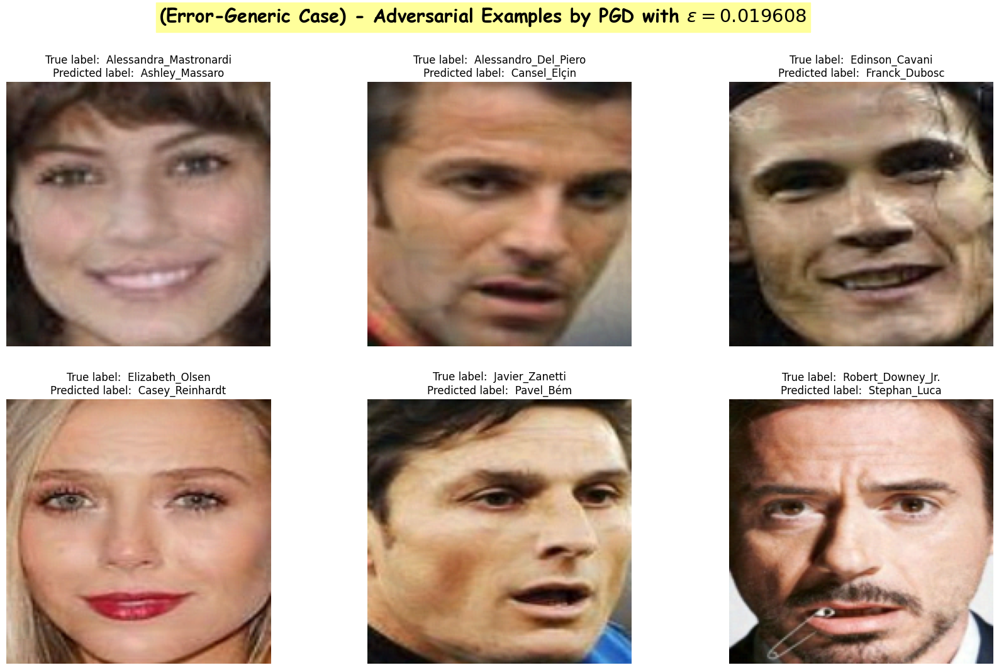

In [167]:
# Load the adversarial examples and labels
if not pgd_generate:
    eps = 5/255
    x_test_adv_pgd_g = torch.load('attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    y_test_adv_pgd_g = LABELS[np.argmax(classifier.predict(x_test_adv_pgd_g), axis=1)]

# Plot the adversarial examples generated using the PGD Attack
plot_predicted_images(x_test=x_test_adv_pgd_g, y_true=y_true, y_pred=y_test_adv_pgd_g, title="(Error-Generic Case) - Adversarial Examples by PGD with $\epsilon = {:2f}$".format(pgd_parameters["eps"]))

# Get the accuracy of the model on the adversarial examples generated using the PGD Attack
accuracy_pgd = accuracy_score(y_true, y_test_adv_pgd_g)
logger.info("Accuracy PGD: {0}".format(accuracy_pgd))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_pgd_g))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}".format(nb_correct_adv_pred, test_set_size - nb_correct_adv_pred)
)

# Get the perturbation for the adversarial examples generated using the PGD Attack
perturbation_pgd = np.mean(np.abs(x_test_adv_pgd_g- x_test_aligned))
logger.info("Perturbation PGD: {0}".format(perturbation_pgd))

#### Error Specific

We employ a **targeted attack** (error-specific). The focus is on crafting adversarial examples in order to manipulate the model's predictions in a targeted manner, directing misclassifications towards a specific class or set of classes.

In [168]:
# HyperParameters
pgd_parameters = {
    "eps": 10/255,                          # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 2/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 5,                   # @param {type:"slider", min:1, max:5e1, step:1}
    "targeted": True
}

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Generate adversarial examples using the Projected Gradient Descent (PGD) attack
x_test_adv_pgd_s = attacks.pgd_attack(x_test_aligned, one_hot_targeted_label, **pgd_parameters)
y_test_adv_pgd_s = LABELS[np.argmax(classifier.predict(x_test_adv_pgd_s), axis=1)]

# Save the adversarial examples and labels
torch.save(x_test_adv_pgd_s, 'attacks/PGD/x_test_adv_pgd_s.pt')
torch.save(y_test_adv_pgd_s, 'attacks/PGD/y_test_adv_pgd_s.pt')

SystemExit: 

#### Security Evaluation Curve

In order to determine the optimal **epsilon** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the epsilon values. Through this evaluation, we identified the epsilon values that yielded the highest performance metrics. A value of `eps = 5/255 ` is good enough for both models.

In [172]:
# Set the flag to False if the adversarial examples are already generated
pgd_generate = False

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Hyperparameters
pgd_parameters = {
    "eps": 5/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 1/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 5,                   # @param {type:"slider", min:1, max:5e1, step:1}
}

# Epsilon Range for the PGD attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Evaluating the model for each epsilon value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['eps'] = eps
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, **pgd_parameters)
    torch.save(x_test_adv, 'attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# ERROR SPECIFIC CASE
# -------------------
pgd_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Evaluating the model for each epsilon value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['eps'] = eps
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, one_hot_targeted_label, **pgd_parameters)
    torch.save(x_test_adv, 'attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/PGD/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/PGD/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/PGD/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/PGD/perturbation_nn1_s.pt')

SystemExit: 

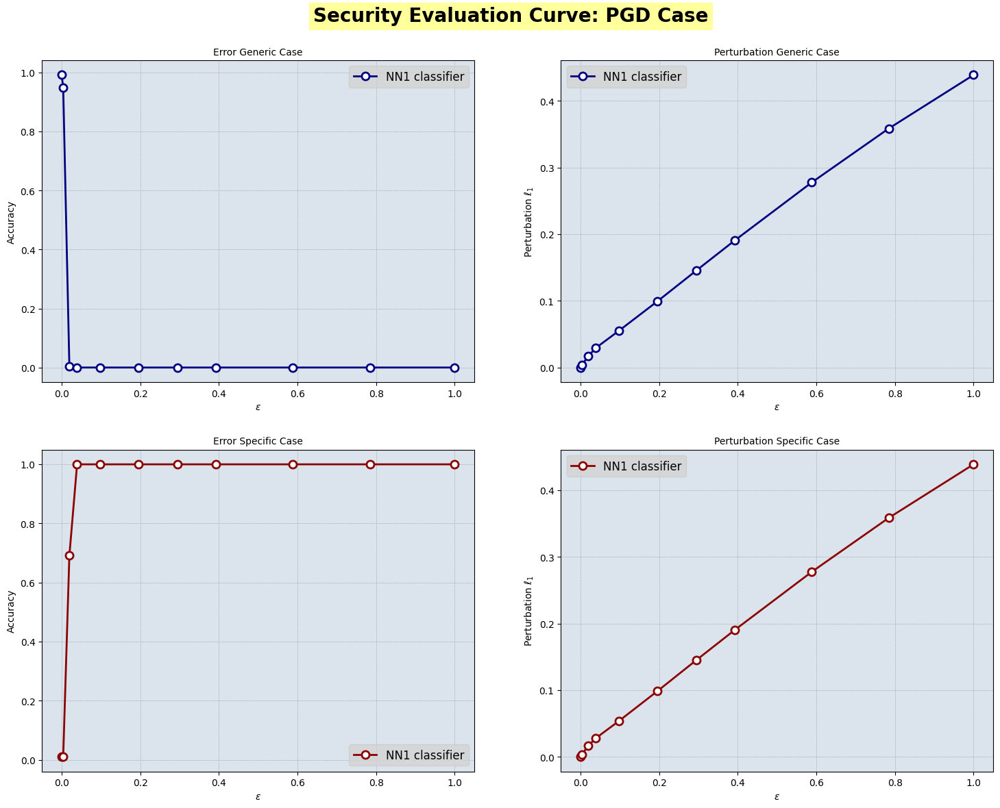

In [173]:
# Define the epsilon range for the PGD attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/PGD/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/PGD/perturbation_nn1_s.pt')

security_evaluation_curves(eps_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "PGD")

In order to determine the optimal **epsilon step** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the epsilon step values. Through this evaluation, we identified the epsilon step values that yielded the highest performance metrics. A value of `eps_step = 2/255 ` is good enough for both models.

In [174]:
# Set the flag to False if the adversarial examples are already generated
pgd_generate = False

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Hyperparameters
pgd_parameters = {
    "eps": 5/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 1/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 8,                   # @param {type:"slider", min:1, max:5e1, step:1}
}

# Epsilon Range for the PGD attack
eps_step_range = [0, 0.1/255, 0.5/255, 1/255, 3/255, 5/255, 10/255]

# # ERROR GENERIC CASE
# # ------------------

# # Initialize the list to store the number of correctly classified images
# nb_correct_nn1_g = list()
# perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps_step in tqdm(eps_step_range[1:], desc="(Error Generic) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['eps_step'] = eps_step
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# ERROR SPECIFIC CASE
# -------------------
pgd_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps_step in tqdm(eps_step_range[1:], desc="(Error Specific) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['eps_step'] = eps_step
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, one_hot_targeted_label, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/PGD/eps_range/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/PGD/eps_range/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/PGD/eps_range/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/PGD/eps_range/perturbation_nn1_s.pt')

SystemExit: 

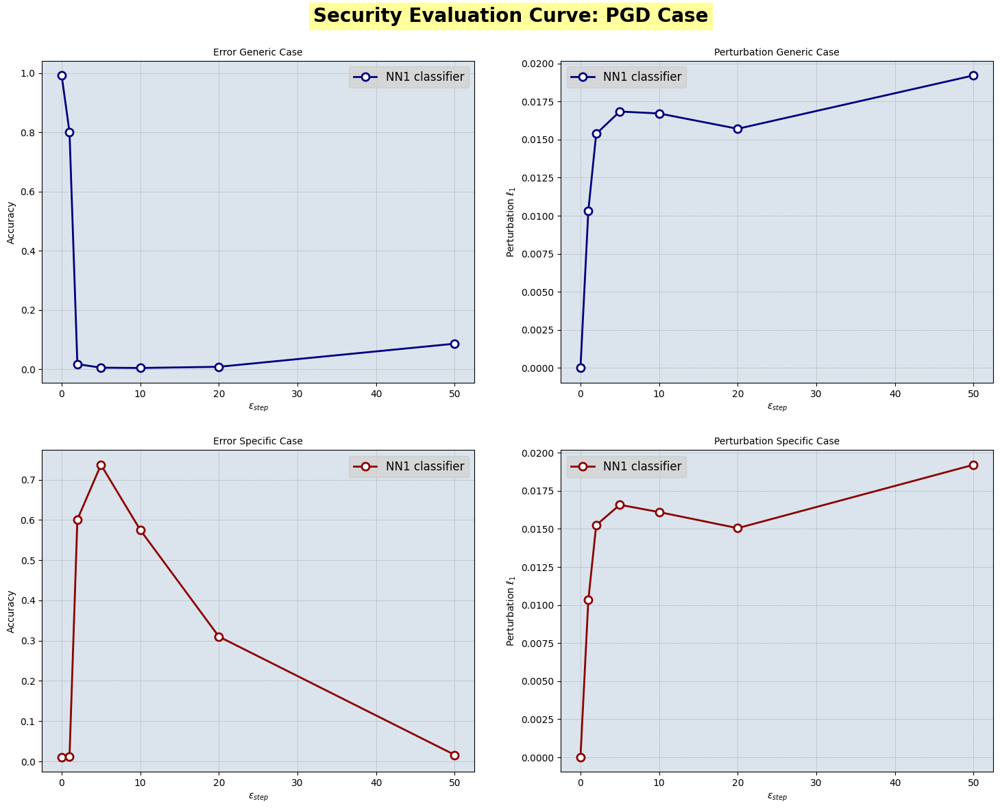

In [175]:
# Define the epsilon step range for the PGD attack
eps_step_range = [0, 0.1/255, 0.5/255, 1/255, 3/255, 5/255, 10/255]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/eps_range/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/eps_range/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/PGD/eps_range/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/PGD/eps_range/perturbation_nn1_s.pt')

security_evaluation_curves(max_iter_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "PGD", '$\epsilon_{step}$')

In order to determine the optimal **max_iter** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the maximum iteration values. Through this evaluation, we identified the max_iter values that yielded the highest performance metrics. A value of `max_iter = 20 ` is good enough for both models.

In [176]:
# Set the flag to False if the adversarial examples are already generated
pgd_generate = False

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Hyperparameters
pgd_parameters = {
    "eps": 5/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 1/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 8,                   # @param {type:"slider", min:1, max:5e1, step:1}
}

# Epsilon Range for the PGD attack
max_iter_range = [0, 1, 2, 5, 10, 20, 50]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for max_iter in tqdm(max_iter_range[1:], desc="(Error Generic) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['max_iter'] = max_iter
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# ERROR SPECIFIC CASE
# -------------------
pgd_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(max_iter_range[1:], desc="(Error Specific) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['max_iter'] = max_iter
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, one_hot_targeted_label, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/PGD/max_iter_range/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/PGD/max_iter_range/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/PGD/max_iter_range/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/PGD/max_iter_range/perturbation_nn1_s.pt')

SystemExit: 

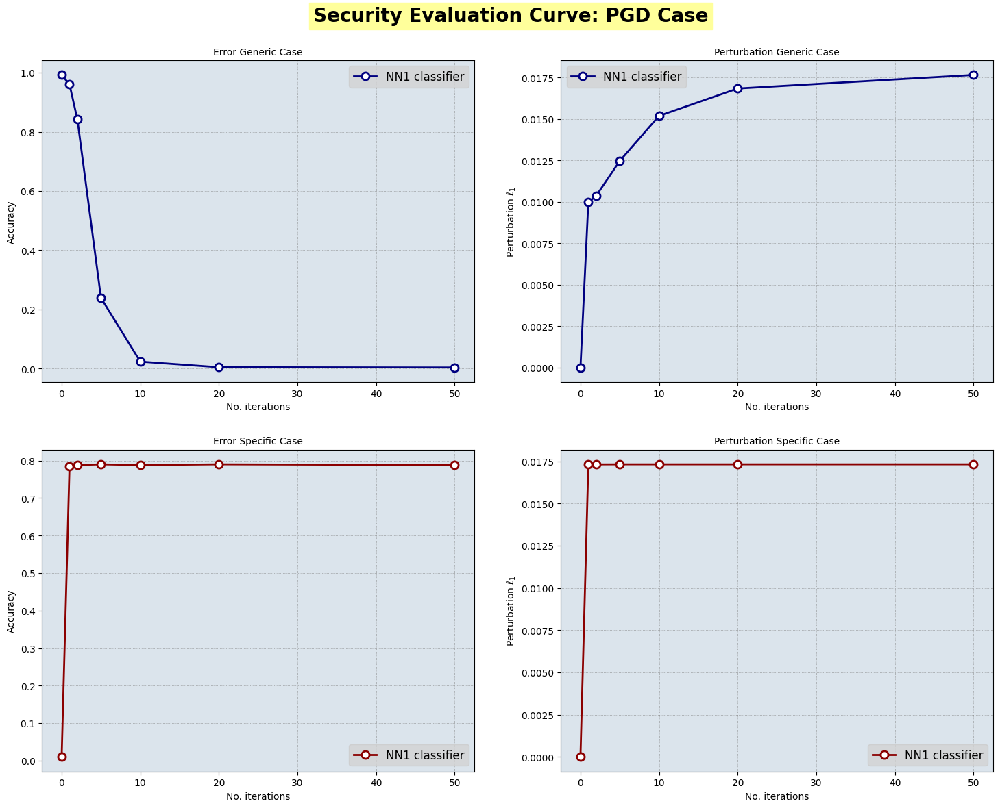

In [177]:
# Define the max iter range for the PGD attack
max_iter_range = [0, 1, 2, 5, 10, 20, 50]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/max_iter_range/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/max_iter_range/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/PGD/max_iter_range/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/PGD/max_iter_range/perturbation_nn1_s.pt')

security_evaluation_curves(max_iter_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "PGD", 'No. iterations')

In order to determine the optimal **number_of_random_init** value, we conducted an evaluation of the Security Evaluation Curves (SECs) while varying the number of random init values. Through this evaluation, we identified the number_of_random_init values that yielded the highest performance metrics. A value of `number_of_random_init = 8` is good enough for both models.

In [178]:
# Set the flag to False if the adversarial examples are already generated
pgd_generate = False

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Hyperparameters
pgd_parameters = {
    "eps": 5/255,                           # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "eps_step": 1/255,                      # @param {type:"slider", min:1e-3, max:1.01e-1, step:0.01}
    "max_iter": 20,                         # @param {type:"slider", min:5, max:1e2, step:1}
    "num_random_init": 3,                   # @param {type:"slider", min:1, max:5e1, step:1}
}

# Epsilon Range for the PGD attack
num_random_init_range = [0, 1, 3, 8, 10, 15]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for num_random_init in tqdm(num_random_init_range[1:], desc="(Error Generic) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['num_random_init'] = num_random_init
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_g += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# ERROR SPECIFIC CASE
# -------------------
pgd_parameters['targeted'] = True

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(num_random_init_range[1:], desc="(Error Specific) Evaluating the model for each epsilon step value", leave=False):
    # Change the epsilon value into the PGD parameters
    pgd_parameters['num_random_init'] = num_random_init
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = attacks.pgd_attack(x_test_aligned, one_hot_targeted_label, **pgd_parameters)
    # torch.save(x_test_adv, 'attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_pgd))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/PGD/num_random_init/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/PGD/num_random_init/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/PGD/num_random_init/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/PGD/num_random_init/perturbation_nn1_s.pt')

SystemExit: 

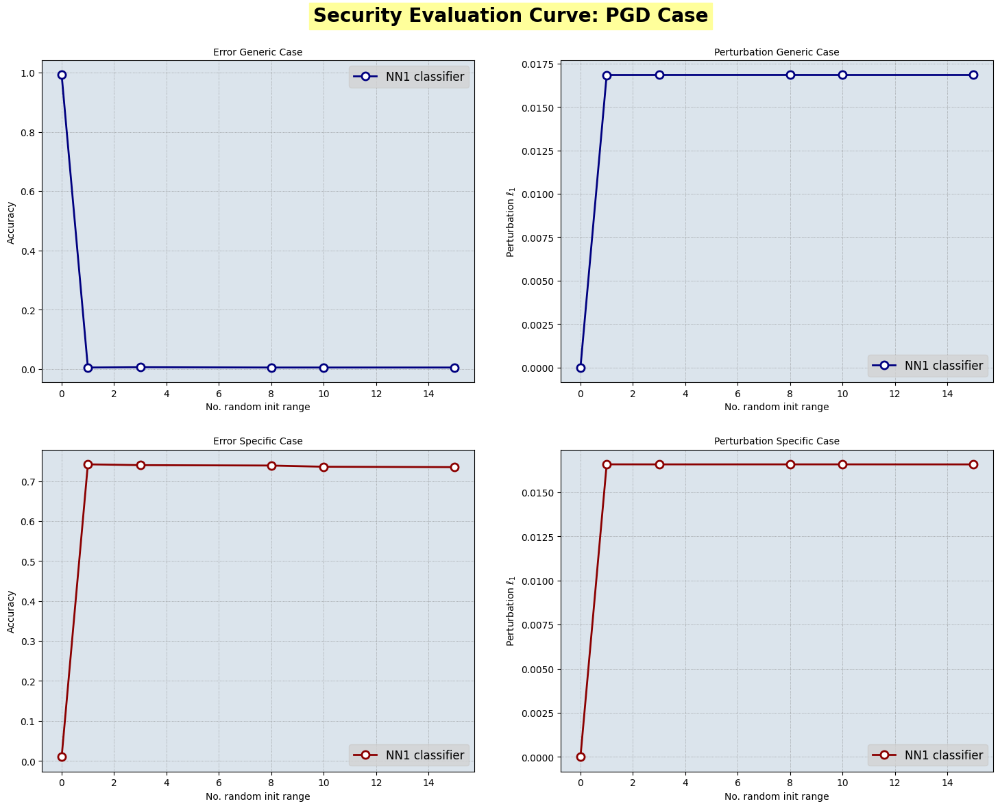

In [179]:
# Define the number of random init for the PGD attack
num_random_init_range = [0, 1, 3, 8, 10, 15]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/num_random_init/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/num_random_init/nb_correct_nn1_s.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/PGD/num_random_init/perturbation_nn1_g.pt')
perturbation_nn1_s = torch.load('security_evaluation_curve/PGD/num_random_init/perturbation_nn1_s.pt')

security_evaluation_curves(num_random_init_range, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "PGD", 'No. random init range')

## **DeepFool**

In [12]:
deepfool_generate = False

#### Error Generic

We employ a **non-targeted attack** (error-generic). The focus is on crafting adversarial examples without a specific target in mind. The objective is to generate perturbations on the input data that cause misclassification across various classes without prioritizing any particular outcome.

[INFO] Accuracy DeepFool: 0.002
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 2        
 	 • Incorrectly classified: 998
[INFO] Perturbation DeepFool: 0.00665339594706893


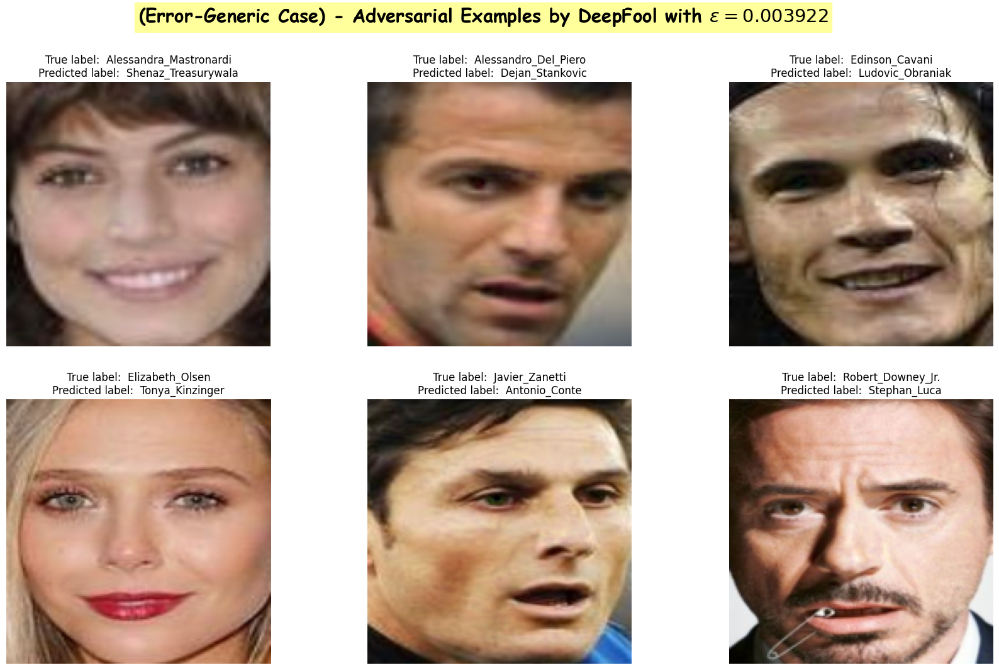

In [228]:
# Define the epsilon range for the DeepFool attack
eps_range = [1/255, 10/255, 25/255, 100/255, 1]

# Test the model on the adversarial examples generated using the DeepFool attack
eps = eps_range[0]
x_test_adv_df_g = torch.load('attacks/DeepFool/Generic/x_test_adv_nn1_g_{}.pt'.format(eps))
y_test_adv_df = LABELS[np.argmax(classifier.predict(x_test_adv_df_g), axis=1)]

# Plot the adversarial examples generated using DeepFool
plot_predicted_images(x_test=x_test_adv_df_g, y_true=y_true, y_pred=y_test_adv_df, title="(Error-Generic Case) - Adversarial Examples by DeepFool with $\epsilon = {:2f}$".format(eps))

# Get the accuracy of the model on the adversarial examples generated using DeepFool
accuracy_df = accuracy_score(y_true, y_test_adv_df)
logger.info("Accuracy DeepFool: {0}".format(accuracy_df))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_df))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}".format(nb_correct_adv_pred, test_set_size - nb_correct_adv_pred)
)

# Get the perturbation for the adversarial examples generated using DeepFool
perturbation_df = np.mean(np.abs(x_test_adv_df_g- x_test_aligned))
logger.info("Perturbation DeepFool: {0}".format(perturbation_df))

#### Security Evaluation Curve

In [181]:
import json

# HyperParameters
df_parameters = {
    "epsilon": 15/255,                     # @param {type:"slider", min:1e-3, max:1.01, step:0.01}
    "max_iter": 1,                       # @param {type:"slider", min:5, max:1e2, step:1}
    "nb_grads": 1,                        # @param {type:"slider", min:1, max:1e2, step:1}  
    "batch_size": 16                      # @param {type:"slider", min:1, max:5e3, step:1}    
}

# Epsilon Range for the DeepFool attack
eps_range = [0, 1/255, 10/255, 25/255, 100/255, 1]

# Stop the execution of the code if the adversarial examples are already generated (deepfool_generate = False)

# Convert the dictionary and the list into JSON strings
df_parameters_str = json.dumps(df_parameters)
eps_range_str = json.dumps(eps_range)

if not deepfool_generate:
    raise SystemExit

# Execute the Python script to generate the adversarial examples using the DeepFool attack
# NOTE: We execute the script using the subprocess module to avoid the Jupyter Notebook cell from freezing during the execution.
# By so doing, the process should be faster and more efficient than running the script directly in the cell. This is because the
# Juptyer Notebook not allow to parallelize the execution of the commands in the cell.
!python attacks/deepfool.py --classifier_path "classifier.pt" --dataloader_aligned_path "dataloader_aligned.pt" --df_parameters "$df_parameters" --eps_range "$eps_range" --y_true_path "y_true.pt"

# Load the adversarial examples and labels
# nb_correct_nn1_g = torch.load('security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
# nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
# perturbation_nn1_g = torch.load('security_evaluation_curve/DeepFool/perturbation_nn1_g.pt')
# perturbation_nn1_g = [0] + perturbation_nn1_g

# Save the results into a file
# torch.save(nb_correct_nn1_g, 'security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
# torch.save(perturbation_nn1_g, 'security_evaluation_curve/DeepFool/perturbation_nn1_g.pt')

SystemExit: 

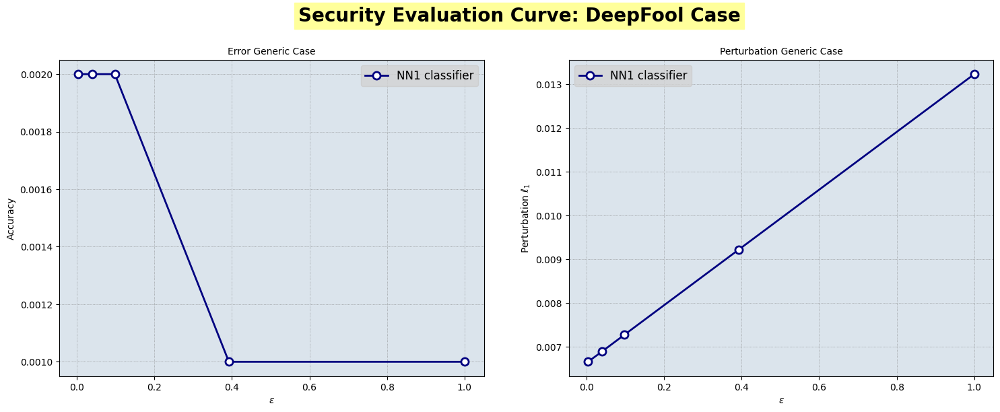

In [182]:
# Define the epsilon range for the BIM attack
eps_range = [1/255, 10/255, 25/255, 100/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
perturbation_nn1_g = torch.load('security_evaluation_curve/DeepFool/perturbation_nn1_g.pt')

security_evaluation_curves(eps_range, nb_correct_nn1_g, None, perturbation_nn1_g, None, "DeepFool")

## **Carlini-Wagner**

In [183]:
carlini_generate = False

#### Error Generic

We employ a **non-targeted attack** (error-generic). The focus is on crafting adversarial examples without a specific target in mind. The objective is to generate perturbations on the input data that cause misclassification across various classes without prioritizing any particular outcome.

[INFO] Accuracy Carlini&Wagner: 0.003
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 3        
 	 • Incorrectly classified: 997
[INFO] Perturbation Carlini&Wagner: 0.0028850839007645845


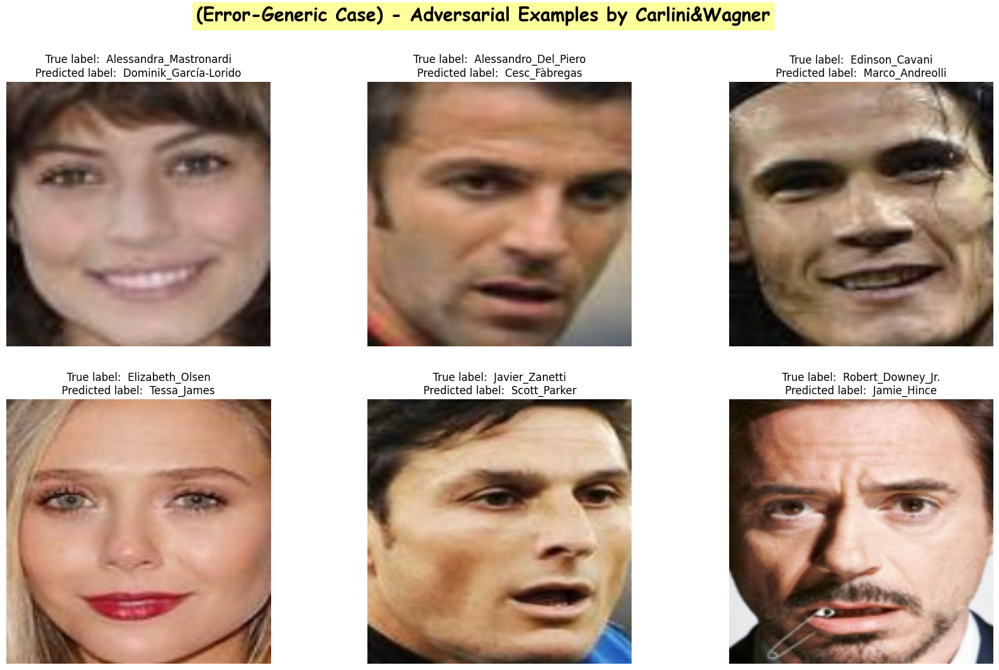

In [226]:
# Load the adversarial examples and labels
x_test_adv_cw_g = torch.load('attacks/Carlini/Generic/x_test_adv_nn1_g_10.pt')
y_test_adv_cw = LABELS[np.argmax(classifier.predict(x_test_adv_cw_g), axis=1)]

# Plot the adversarial examples generated using the Carlini and Wagner Attack
plot_predicted_images(x_test=x_test_adv_cw_g, y_true=y_true, y_pred=y_test_adv_cw, title="(Error-Generic Case) - Adversarial Examples by Carlini&Wagner")

# Get the accuracy of the model on the adversarial examples generated using the Carlini and Wagner Attack
accuracy_cw = accuracy_score(y_true, y_test_adv_cw)
logger.info("Accuracy Carlini&Wagner: {0}".format(accuracy_cw))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_cw))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}".format(nb_correct_adv_pred, test_set_size - nb_correct_adv_pred)
)

# Get the perturbation for the adversarial examples generated using the Carlini and Wagner Attack
perturbation_cw = np.mean(np.abs(x_test_adv_cw_g- x_test_aligned))
logger.info("Perturbation Carlini&Wagner: {0}".format(perturbation_cw))

#### Error Specific

We employ a **targeted attack** (error-specific). The focus is on crafting adversarial examples in order to manipulate the model's predictions in a targeted manner, directing misclassifications towards a specific class or set of classes.

[INFO] Accuracy Carlini&Wagner: 0.325
[INFO] Adversarial test data (1000 images):        
 	 • Correctly classified: 325        
 	 • Incorrectly classified: 675        
 	 • Correctly classified as Andrew_Lincoln: 680        
 	 • Incorrectly classifed as Andrew_Lincoln: 320
[INFO] Perturbation Carlini&Wagner: 0.00443629315122962


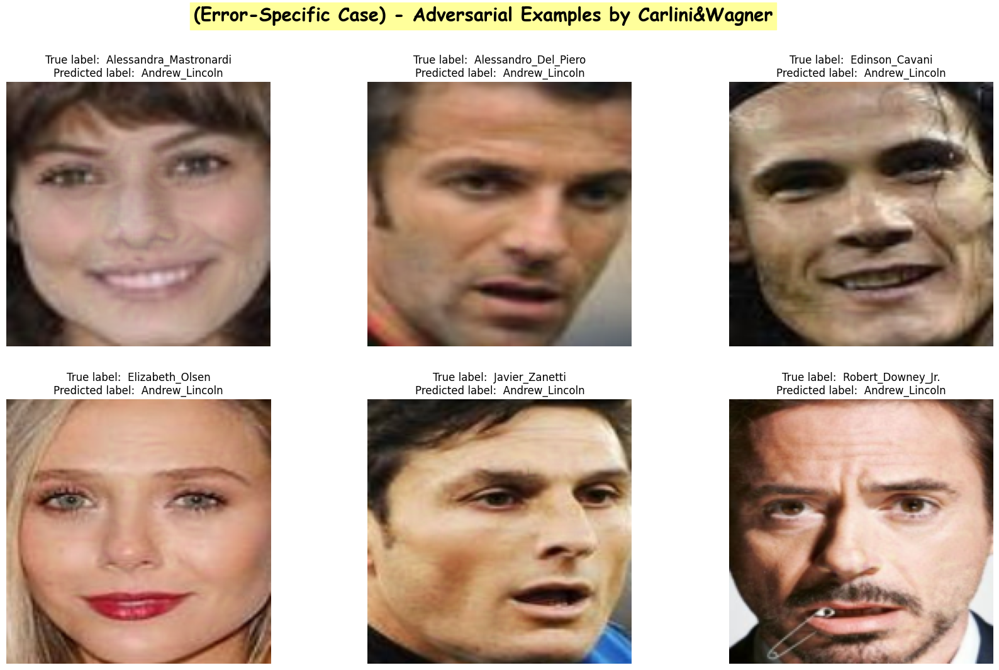

In [227]:
# Load the adversarial examples and labels
x_test_adv_cw_s = torch.load('attacks/Carlini/Specific/x_test_adv_nn1_s_10.pt')
y_test_adv_cw = LABELS[np.argmax(classifier.predict(x_test_adv_cw_s), axis=1)]

# Plot the adversarial examples generated using the Carlini and Wagner Attack
plot_predicted_images(x_test=x_test_adv_cw_s, y_true=y_true, y_pred=y_test_adv_cw, title="(Error-Specific Case) - Adversarial Examples by Carlini&Wagner")

# Get the accuracy of the model on the adversarial examples generated using the Carlini and Wagner Attack
accuracy_cw = accuracy_score(y_true, y_test_adv_cw)
logger.info("Accuracy Carlini&Wagner: {0}".format(accuracy_cw))

# Conta il numero di immagini classificate correttamente
nb_correct_adv_pred = np.sum(np.array(y_true) == np.array(y_test_adv_cw))
nb_correct_adv_pred_target = np.sum(np.array(y_test_adv_cw) == np.tile(LABELS[target_class], test_set_size))

logger.info("Adversarial test data (1000 images):\
        \n \t • Correctly classified: {0}\
        \n \t • Incorrectly classified: {1}\
        \n \t • Correctly classified as{2}: {3}\
        \n \t • Incorrectly classifed as{4}: {5}".format(
                nb_correct_adv_pred, test_set_size - nb_correct_adv_pred,\
                LABELS[target_class], nb_correct_adv_pred_target, 
                LABELS[target_class], test_set_size - nb_correct_adv_pred_target                
        )
)

# Get the perturbation for the adversarial examples generated using the Carlini and Wagner Attack
perturbation_cw = np.mean(np.abs(x_test_adv_cw_s- x_test_aligned))
logger.info("Perturbation Carlini&Wagner: {0}".format(perturbation_cw))

#### Security Evaluation Curve

In [186]:
import json

# HyperParameters
cw_parameters = {
    "binary_search_steps": 10, 
    "max_iter": 7, 
    "confidence": 0.3, 
    "learning_rate": 0.05, 
    "initial_const": 0.01, 
    "batch_size": 32
}

# Epsilon Range for the DeepFool attack
binary_search_steps = [2, 5, 10]

# Stop the execution of the code if the adversarial examples are already generated (deepfool_generate = False)

# Convert the dictionary and the list into JSON strings
df_parameters_str = json.dumps(cw_parameters)
eps_range_str = json.dumps(eps_range)

# Stop the execution of the code if the adversarial examples are already generated (carlini_generate = False)
if not carlini_generate:
    raise SystemExit

# Execute the Python script to generate the adversarial examples using the DeepFool attack
# NOTE: We execute the script using the subprocess module to avoid the Jupyter Notebook cell from freezing during the execution.
# By so doing, the process should be faster and more efficient than running the script directly in the cell. This is because the
# Juptyer Notebook not allow to parallelize the execution of the commands in the cell.
!python attacks/carlini.py  --binary_search_steps "$binary_search_steps" --classifier_path "classifier.pt" --cw_parameters "$cw_parameters" --dataloader_aligned_path "dataloader_aligned.pt" --y_true_path "y_true.pt"

# Load the adversarial examples and labels
nb_correct_nn1_g = torch.load('security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
nb_correct_nn1_g = [nb_correct_pred] + nb_correct_nn1_g
perturbation_nn1_g = torch.load('security_evaluation_curve/DeepFool/perturbation_nn1_g.pt')
perturbation_nn1_g = [0] + perturbation_nn1_g

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/DeepFool/perturbation_nn1_g.pt')

SystemExit: 

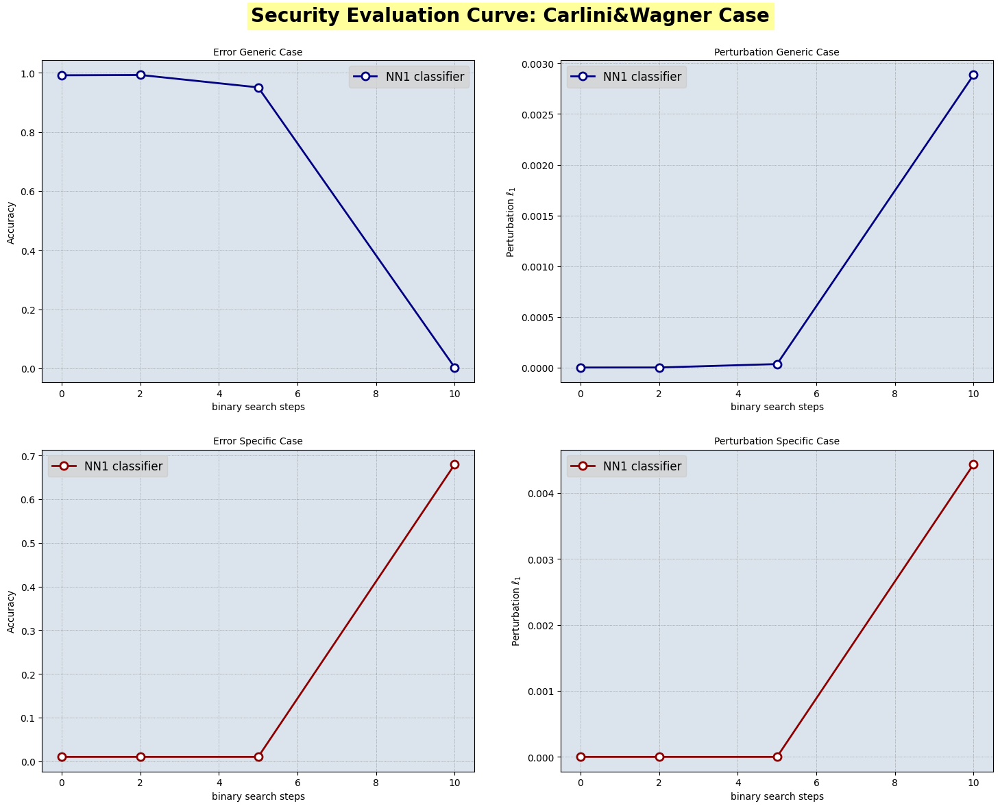

In [188]:
# Define the epsilon range for the PGD attack
binary_search_steps = [0, 2, 5, 10]

# Load the results from the file
nb_correct_nn1_g = [nb_correct_pred] + torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_g.pt')
nb_correct_nn1_s = [nb_correct_pred_target] + torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_s.pt')
perturbation_nn1_g = [0] + torch.load('security_evaluation_curve/Carlini/perturbation_nn1_g.pt')
perturbation_nn1_s = [0] + torch.load('security_evaluation_curve/Carlini/perturbation_nn1_s.pt')

security_evaluation_curves(binary_search_steps, nb_correct_nn1_g, nb_correct_nn1_s, perturbation_nn1_g, perturbation_nn1_s, "Carlini&Wagner", "binary search steps")

<a id="nn2"></a>
# **5. Alternative Classifier Testing 🔄**

In this section, our objective is to extend our evaluation of facial recognition classifiers by integrating an additional model trained on the VGG-Face2 dataset. This chosen classifier, referred to hereafter as NN2, will complement our existing NN1 model in our comparative analysis. The chosen classifier is **`Senet50`**. This model offers a robust framework known for its feature extraction capabilities, particularly well-suited for image classification tasks such as those presented in the VGG-Face2 dataset.

In [189]:
from NN2.models.senet import *
from NN2.utils import *
from NN2.trainer import *
from NN2.datasets.dataset import NN2Dataset
from NN2.datasets.vgg_face2 import VGG_Faces2
from utils import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the ResNet50 model
nn2 = senet50(num_classes=8631, include_top=True)
id_label_dict = get_id_label_map("datasets\identity_meta.csv")

# Load the weights of the model
load_state_dict(nn2, 'NN2/senet50_ft_weight.pkl')
nn2 = nn2.eval().to(device)

# Read the image_list_file.csv file
image_list_csv = pd.read_csv(
    filepath_or_buffer='datasets/TestSet/image_list_file.csv',
    sep=';',
    skipinitialspace=True,                              # Skip spaces after delimiter
    engine='python'                                     # Parser engine
)

### Evaluate the Test Set on the NN1

In the following section, we evaluate the test by creating a validation dataset using the `VGG_Face2` class. Then, the `validate()` method of the `Validator` object is called. This method likely runs the validation process, using the model to make predictions on the validation set, comparing these predictions to the true labels, calculating the loss, and logging the results. Using `senet50` as NN2 we achieve the following results:
    
- `Loss: 0.0212 (0.1060)`: This is showing the loss for the current batch (0.0212) and the average loss so far (0.1060). The loss is a measure of how well the model's predictions match the true labels.
- `Prec@1: 100.000 (98.220)`: This is showing the top-1 accuracy for the current batch (100.000%) and the average top-1 accuracy so far (98.220%). Top-1 accuracy is the percentage of times the model's top prediction was correct.
- `Prec@5: 100.000 (99.400)`: This is showing the top-5 accuracy for the current batch (100.000%) and the average top-5 accuracy so far (99.400%). Top-5 accuracy is the percentage of times the true label was among the model's top 5 predictions.


In [ ]:
# Load the validation dataset and create the DataLoader
val_dataset = VGG_Faces2(root=os.getcwd(), image_list_file='datasets\TestSet\image_list_file.csv', id_label_dict=id_label_dict, split='valid')
val_loader = DataLoader(dataset=val_dataset, batch_size=1)

# Initialize the validator to evaluate the model
validator = Validator(cmd="test", model=nn2, cuda=device, val_loader=val_loader, criterion=nn.CrossEntropyLoss(), log_file='log.txt', print_freq=100)
validator.validate()

Valid iteration=0 epoch=0:   0%|               | 1/1000 [00:00<07:06,  2.34it/s]

Test: [0/1000/1]	epoch: 0	iter: 0	Time: 0.425 (0.425)	Loss: 0.0017 (0.0017)	Prec@1: 100.000 (100.000)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  10%|█▎           | 101/1000 [00:28<04:01,  3.73it/s]

Test: [100/1000/101]	epoch: 0	iter: 0	Time: 0.268 (0.286)	Loss: 0.0846 (0.1186)	Prec@1: 100.000 (97.030)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  20%|██▌          | 201/1000 [00:55<03:34,  3.72it/s]

Test: [200/1000/201]	epoch: 0	iter: 0	Time: 0.272 (0.278)	Loss: 0.0411 (0.0799)	Prec@1: 100.000 (98.507)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  30%|███▉         | 301/1000 [01:22<03:08,  3.71it/s]

Test: [300/1000/301]	epoch: 0	iter: 0	Time: 0.267 (0.275)	Loss: 0.0106 (0.1190)	Prec@1: 100.000 (97.674)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  40%|█████▏       | 401/1000 [01:49<02:39,  3.75it/s]

Test: [400/1000/401]	epoch: 0	iter: 0	Time: 0.259 (0.273)	Loss: 0.0003 (0.1049)	Prec@1: 100.000 (98.254)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  50%|██████▌      | 501/1000 [02:16<02:11,  3.78it/s]

Test: [500/1000/501]	epoch: 0	iter: 0	Time: 0.257 (0.273)	Loss: 0.0022 (0.0943)	Prec@1: 100.000 (98.603)	Prec@5: 100.000 (100.000)	


Valid iteration=0 epoch=0:  60%|███████▊     | 601/1000 [02:43<01:47,  3.72it/s]

Test: [600/1000/601]	epoch: 0	iter: 0	Time: 0.269 (0.272)	Loss: 0.0006 (0.0953)	Prec@1: 100.000 (98.669)	Prec@5: 100.000 (99.834)	


Valid iteration=0 epoch=0:  70%|█████████    | 701/1000 [03:10<01:19,  3.76it/s]

Test: [700/1000/701]	epoch: 0	iter: 0	Time: 0.265 (0.271)	Loss: 0.0199 (0.0989)	Prec@1: 100.000 (98.431)	Prec@5: 100.000 (99.857)	


Valid iteration=0 epoch=0:  80%|██████████▍  | 801/1000 [03:36<00:53,  3.75it/s]

Test: [800/1000/801]	epoch: 0	iter: 0	Time: 0.270 (0.271)	Loss: 0.0033 (0.0988)	Prec@1: 100.000 (98.377)	Prec@5: 100.000 (99.750)	


Valid iteration=0 epoch=0:  90%|███████████▋ | 901/1000 [04:03<00:26,  3.72it/s]

Test: [900/1000/901]	epoch: 0	iter: 0	Time: 0.271 (0.271)	Loss: 0.0212 (0.1060)	Prec@1: 100.000 (98.335)	Prec@5: 100.000 (99.556)	


Test: [999/1000/1000]	epoch: 0	iter: 0	Time: 0.265 (0.270)	Loss: 0.0483 (0.1120)	Prec@1: 100.000 (98.200)	Prec@5: 100.000 (99.400)	


Using our `evaluate_model` function, we generate predicted labels on the `x_test_aligned`. Subsequently, we compute the overall accuracy using `SeNet50`. We obtained an accuracy 'equal' to the one obtained with the NN1 on the clean data.

In [20]:
dataset_nn2 = NN2Dataset(x_test_aligned, 'datasets/TestSet/image_list_file.csv', transform=True)
dataloader_nn2 = DataLoader(dataset_nn2, batch_size=1, shuffle=False)
dataloader_nn2.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}

# Evaluate the accuracy of the model
y_true_nn2, y_pred_nn2 = evaluate_model(nn2, dataloader_nn2, LABELS)

# Evaluate the accuracy of the model
accuracy_nn2 = accuracy_score(y_true_nn2, y_pred_nn2)
logger.info("Accuracy of SENet50: {0}".format(accuracy_nn2))

# Get the number of correctly classified images
nb_correct_pred_nn2 = np.sum(np.array(y_true_nn2) == np.array(y_pred_nn2))

logger.info("Original test data (1000 images):\
        \n • Correctly classified: {0}\
        \n • Incorrectly classified: {1}".format(nb_correct_pred_nn2, 1000 - nb_correct_pred_nn2)
) 

Evaluating the model:   0%|          | 0/1000 [00:00<?, ?it/s]

[INFO] Accuracy of SENet50: 0.993                                       
[INFO] Original test data (1000 images):        
 • Correctly classified: 993        
 • Incorrectly classified: 7


<a id="transferability"></a>
# **6. Transferability 🔄**

The goal of this phase is to investigate the **transferability** of adversarial examples generated for classifier NN1 to classifier NN2. 

> The concept of transferability in adversarial attacks refers to the ability of adversarial examples generated for one model to deceive another model. By testing the same set of adversarial examples against both NN1 and NN2, we aim to evaluate whether the vulnerabilities exploited by adversarial attacks generalize across different classifiers. 

This investigation is crucial for assessing the robustness and generalization capability of NN2 against adversarial attacks. If adversarial examples crafted for NN1 consistently lead to misclassifications in NN2, it indicates a shared vulnerability or similarity in decision boundaries between the two classifiers. Conversely, if NN2 demonstrates resilience against the same adversarial examples, it suggests differences in how NN2 processes inputs compared to NN1, potentially highlighting NN2's robustness against adversarial perturbations. To investigate the transferability, we analyze and compare the **Security Evaluation Curves** (SECs) of NN1 and NN2 using adversarial images generated for NN1 through various attack methods: FGSM (Fast Gradient Sign Method), BIM (Basic Iterative Method), PGD (Projected Gradient Descent), DeepFool, and Carlini-Wagner attacks. These SECs provide a graphical depiction of each network's resilience to adversarial attacks, showing how their classification accuracy changes as the attack strength increases, typically indicated by parameters like epsilon. This comparison seeks to investigate whether adversarial examples crafted to deceive NN1 also impact NN2 similarly across different attack types, thereby assessing the transferability of adversarial vulnerabilities between the two classifiers.

### FGSM

In [190]:
# Set the flag to False if nb_correct_nn2_g has already been generated.
fgsm_generate_nn2 = False

The objective is to evaluate the transferability of adversarial examples generated using the **FGSM** (Fast Gradient Sign Method) attack on NN1 to the performance of NN2. By varying the epsilon parameter in the FGSM attack, we generate adversarial examples and assess NN2's classification accuracy. This analysis aims to determine if adversarial examples crafted for NN1 using FGSM also affect NN2 similarly, thereby exploring the transferability of adversarial vulnerabilities between the two classifiers under different attack intensities.

In [191]:
# Epsilon Range for the FGSM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Stop the execution of the code if the adversarial examples are already generated (fgsm_generate_nn2 = False)
if not fgsm_generate_nn2:
    raise SystemExit

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_g = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='[Error Generic] Testing FGSM Attack on NN2', leave=False):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = torch.load('attacks/FGSM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_g += [np.sum(np.array(y_true) == np.array(y_pred))]

# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_s = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='[Error Specific] Testing FGSM Attack on NN2', leave=False):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = torch.load('attacks/FGSM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_s += [np.sum(np.tile(LABELS[target_class], len(y_true)) == np.array(y_pred))]

# Save the results into a file
nb_correct_nn2_g = [nb_correct_pred_nn2] + nb_correct_nn2_g
nb_correct_nn2_s = [nb_correct_pred_target] + nb_correct_nn2_s
# torch.save(nb_correct_nn2_g, 'security_evaluation_curve/FGSM/nb_correct_nn2_g.pt')
torch.save(nb_correct_nn2_s, 'security_evaluation_curve/FGSM/nb_correct_nn2_s.pt')

SystemExit: 

Through the evaluation of security evaluation curves (SEC), we observe that adversarial examples deceive the NN2 classifier similar to NN1, although NN2 maintains a slightly higher level of accuracy.

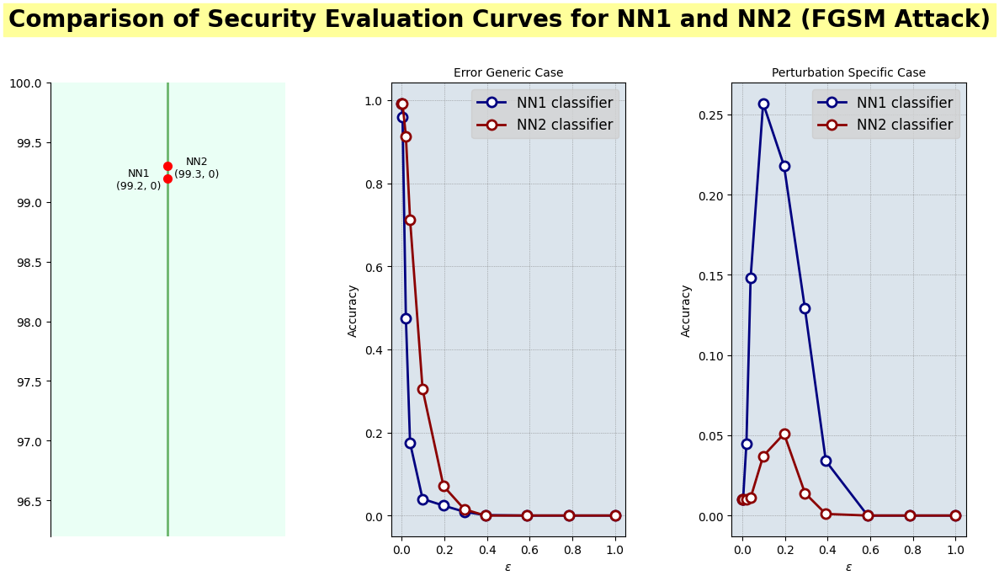

In [193]:
# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_g.pt')
nb_correct_nn2_g = torch.load('security_evaluation_curve/FGSM/nb_correct_nn2_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_s.pt')
nb_correct_nn2_s = torch.load('security_evaluation_curve/FGSM/nb_correct_nn2_s.pt')

# Compare the security evaluation curves for NN1 and NN2 (FGSM Attack)
compare_sec(eps_range, accuracy_nn1, accuracy_nn2, nb_correct_nn1_g, nb_correct_nn2_g, nb_correct_nn1_s, nb_correct_nn2_s, title='Comparison of Security Evaluation Curves for NN1 and NN2 (FGSM Attack)')

### BIM

In [194]:
# Set the flag to False if nb_correct_nn2_g has already been generated.
bim_generate_nn2 = False

The objective is to evaluate the transferability of adversarial examples generated using the **BIM** (Basic Iterative Method) attack on NN1 to the performance of NN2. By varying the epsilon parameter in the BIM attack, we generate adversarial examples and assess NN2's classification accuracy. This analysis aims to determine if adversarial examples crafted for NN1 using BIM also affect NN2 similarly, thereby exploring the transferability of adversarial vulnerabilities between the two classifiers under different attack intensities.

In [195]:
# Epsilon Range for the BIM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Stop the execution of the code if the adversarial examples are already generated (bim_generate_nn2 = False)
if not bim_generate_nn2:
    raise SystemExit

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_g = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='Testing BIM Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_g += [np.sum(np.array(y_true) == np.array(y_pred))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_s = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='Testing BIM Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_s += [np.sum(np.tile(LABELS[target_class], len(y_true)) == np.array(y_pred))]
    
# Save the results into a file
nb_correct_nn2_g = [nb_correct_pred_nn2] + nb_correct_nn2_g
nb_correct_nn2_s = [nb_correct_pred_target] + nb_correct_nn2_s

torch.save(nb_correct_nn2_g, 'security_evaluation_curve/BIM/nb_correct_nn2_g.pt')
torch.save(nb_correct_nn2_s, 'security_evaluation_curve/BIM/nb_correct_nn2_s.pt')

SystemExit: 

Through the evaluation of security evaluation curves (SEC), we observe that adversarial examples deceive the NN2 classifier similar to NN1, although NN2 maintains a slightly higher level of accuracy.

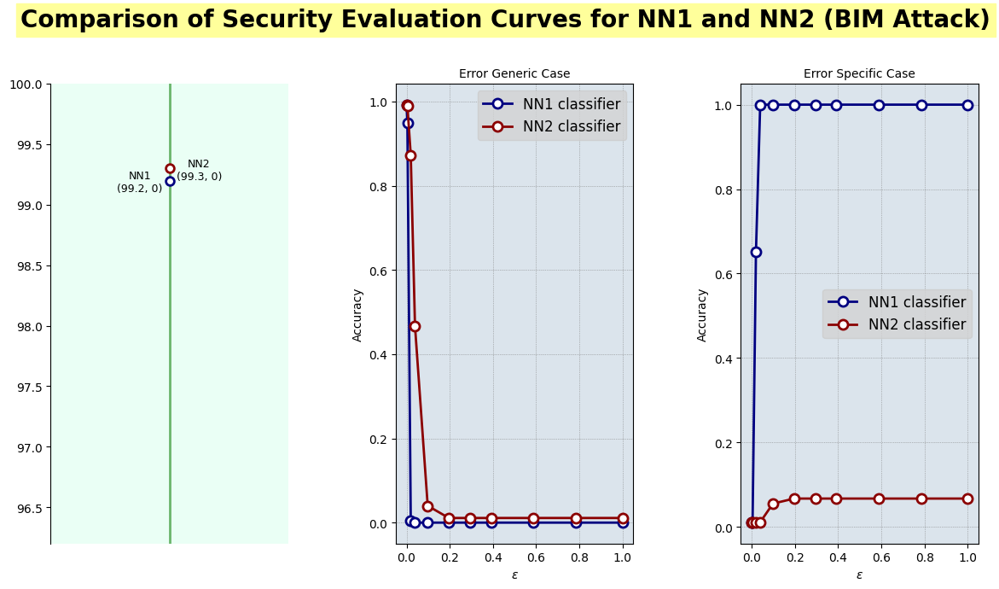

In [53]:
# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_g.pt')
nb_correct_nn2_g = torch.load('security_evaluation_curve/BIM/nb_correct_nn2_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_s.pt')
nb_correct_nn2_s = torch.load('security_evaluation_curve/BIM/nb_correct_nn2_s.pt')

# Compare the security evaluation curves for NN1 and NN2 (BIM Attack)
compare_sec(eps_range, accuracy_nn1, accuracy_nn2, nb_correct_nn1_g, nb_correct_nn2_g, nb_correct_nn1_s, nb_correct_nn2_s, title='Comparison of Security Evaluation Curves for NN1 and NN2 (BIM Attack)')

### PGD

In [55]:
# Set the flag to False if nb_correct_nn2_g has already been generated.
pgd_generate_nn2 = True

The objective is to evaluate the transferability of adversarial examples generated using the **PGD** (Projected Gradient Descent) attack on NN1 to the performance of NN2. By varying the epsilon parameter in the PGD attack, we generate adversarial examples and assess NN2's classification accuracy. This analysis aims to determine if adversarial examples crafted for NN1 using PGD also affect NN2 similarly, thereby exploring the transferability of adversarial vulnerabilities between the two classifiers under different attack intensities.

In [58]:
# Epsilon Range for the PGD attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Stop the execution of the code if the adversarial examples are already generated (bim_generate_nn2 = False)
if not pgd_generate_nn2:
    raise SystemExit

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_g = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='Testing PGD Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_g += [np.sum(np.array(y_true) == np.array(y_pred))]

# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_s = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='Testing PGD Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_s += [np.sum(np.tile(LABELS[target_class], len(y_true)) == np.array(y_pred))]

# Save the results into a file
nb_correct_nn2_g = [nb_correct_pred_nn2] + nb_correct_nn2_g
nb_correct_nn2_s = [nb_correct_pred_target] + nb_correct_nn2_s

torch.save(nb_correct_nn2_g, 'security_evaluation_curve/PGD/nb_correct_nn2_s.pt')
torch.save(nb_correct_nn2_s, 'security_evaluation_curve/PGD/nb_correct_nn2_s.pt')

Through the evaluation of security evaluation curves (SEC), we observe that adversarial examples deceive the NN2 classifier similar to NN1, although NN2 maintains a slightly higher level of accuracy.

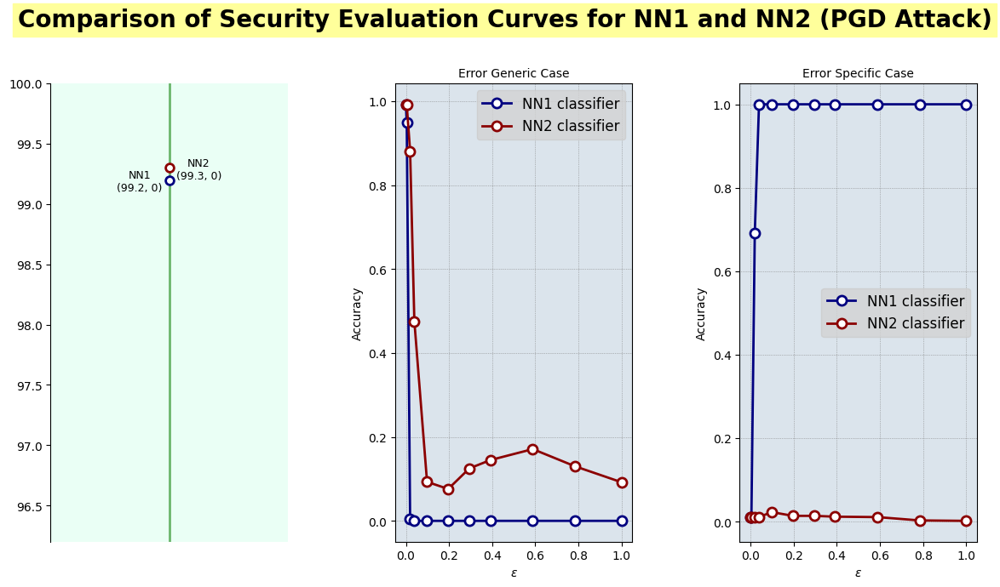

In [60]:
# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_g.pt')
nb_correct_nn2_g = torch.load('security_evaluation_curve/PGD/nb_correct_nn2_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_s.pt')
nb_correct_nn2_s = torch.load('security_evaluation_curve/PGD/nb_correct_nn2_s.pt')

# Compare the security evaluation curves for NN1 and NN2 (PGD Attack)
compare_sec(eps_range, accuracy_nn1, accuracy_nn2, nb_correct_nn1_g, nb_correct_nn2_g, nb_correct_nn1_s, nb_correct_nn2_s, title='Comparison of Security Evaluation Curves for NN1 and NN2 (PGD Attack)')

### DeepFool

In [202]:
# Set the flag to False if nb_correct_nn2_g has already been generated.
df_generate_nn2 = False

The objective is to evaluate the transferability of adversarial examples generated using the **DeepFool** attack on NN1 to the performance of NN2. By varying the epsilon parameter in the DeepFool attack, we generate adversarial examples and assess NN2's classification accuracy. This analysis aims to determine if adversarial examples crafted for NN1 using DeepFool also affect NN2 similarly, thereby exploring the transferability of adversarial vulnerabilities between the two classifiers under different attack intensities.

In [203]:
# Epsilon Range for the DeepFool attack
eps_range = [0, 1/255, 10/255, 25/255, 100/255, 1]

# Stop the execution of the code if the adversarial examples are already generated (bim_generate_nn2 = False)
if not df_generate_nn2:
    raise SystemExit

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_g = list()
# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc='Testing DeepFool Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/DeepFool/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_g += [np.sum(np.array(y_true) == np.array(y_pred))]
    
# Save the results into a file
nb_correct_nn2_g = [nb_correct_pred_nn2] + nb_correct_nn2_g
torch.save(nb_correct_nn2_g, 'security_evaluation_curve/DeepFool/nb_correct_nn2_g.pt')

SystemExit: 

Through the evaluation of security evaluation curves (SEC), we observe that adversarial examples deceive the NN2 classifier similar to NN1, although NN2 maintains a slightly higher level of accuracy.

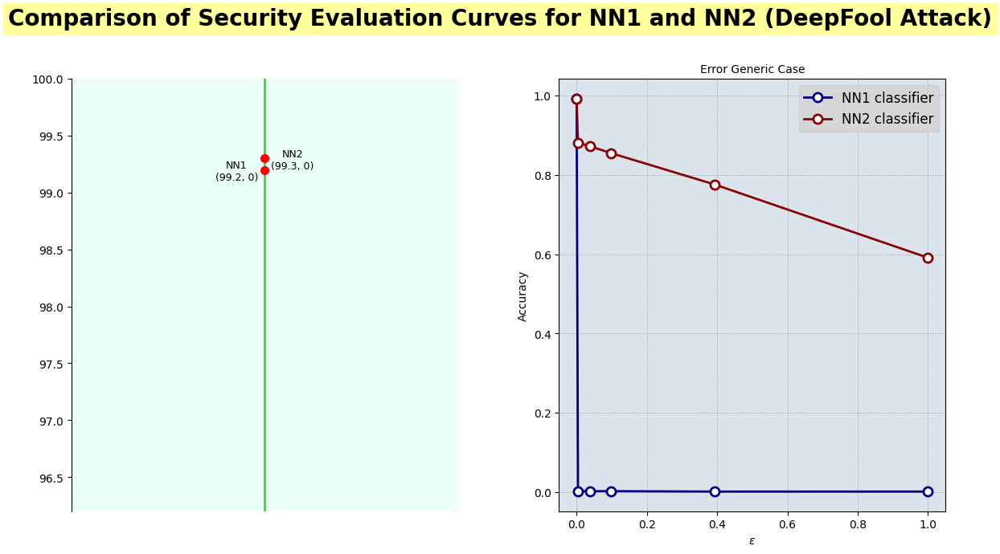

In [204]:
# Load the results from the file
nb_correct_nn1_g = [nb_correct_pred] + torch.load('security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
nb_correct_nn2_g = torch.load('security_evaluation_curve/DeepFool/nb_correct_nn2_g.pt')

# Compare the security evaluation curves for NN1 and NN2 (DeepFool Attack)
compare_sec(eps_range, accuracy_nn1, accuracy_nn2, nb_correct_nn1_g, nb_correct_nn2_g, title='Comparison of Security Evaluation Curves for NN1 and NN2 (DeepFool Attack)')

### Carlini

In [196]:
# Set the flag to False if nb_correct_nn2_g has already been generated.
carlini_generate_nn2 = False

The objective is to evaluate the transferability of adversarial examples generated using the **Carlini & Wagner** attack on NN1 to the performance of NN2. By varying the binary search steps in the Carlini & Wagner attack, we generate adversarial examples and assess NN2's classification accuracy. This analysis aims to determine if adversarial examples crafted for NN1 using Carlini & Wagner also affect NN2 similarly, thereby exploring the transferability of adversarial vulnerabilities between the two classifiers under different attack intensities.

In [197]:
# Epsilon Range for the DeepFool attack
binary_search_steps = [0, 2, 5, 10]

# Stop the execution of the code if the adversarial examples are already generated (bim_generate_nn2 = False)
if not carlini_generate_nn2:
    raise SystemExit

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_g = list()
# Evaluate the model for each epsilon value
for binary_search_step in tqdm(binary_search_steps[1:], desc='Testing Carlini & Wagner Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/Carlini/Generic/x_test_adv_nn1_g_{0}.pt'.format(binary_search_step))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_g += [np.sum(np.array(y_true) == np.array(y_pred))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn2_s = list()
# Evaluate the model for each epsilon value
for binary_search_step in tqdm(binary_search_steps[1:], desc='Testing Carlini & Wagner Attack on NN2', leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/Carlini/Specific/x_test_adv_nn1_s_{0}.pt'.format(binary_search_step))
    dataloader = DataLoader(NN2Dataset(x_test_adv, 'datasets/TestSet/image_list_file.csv', transform=True), batch_size=1, shuffle=False)
    dataloader.dataset.idx_to_class = {v: LABELS[v] for v in image_list_csv['label'].unique()}
    y_true, y_pred = evaluate_model(nn2, dataloader, LABELS)
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn2_s += [np.sum(np.tile(LABELS[target_class], len(y_true)) == np.array(y_pred))]

# Save the results into a file
nb_correct_nn2_g = [nb_correct_pred_nn2] + nb_correct_nn2_g
nb_correct_nn2_s = [nb_correct_pred_target] + nb_correct_nn2_s

torch.save(nb_correct_nn2_g, 'security_evaluation_curve/Carlini/nb_correct_nn2_g.pt')
torch.save(nb_correct_nn2_s, 'security_evaluation_curve/Carlini/nb_correct_nn2_s.pt')

SystemExit: 

Through the evaluation of security evaluation curves (SEC), we observe that adversarial examples deceive the NN2 classifier similar to NN1, although NN2 maintains a slightly higher level of accuracy.

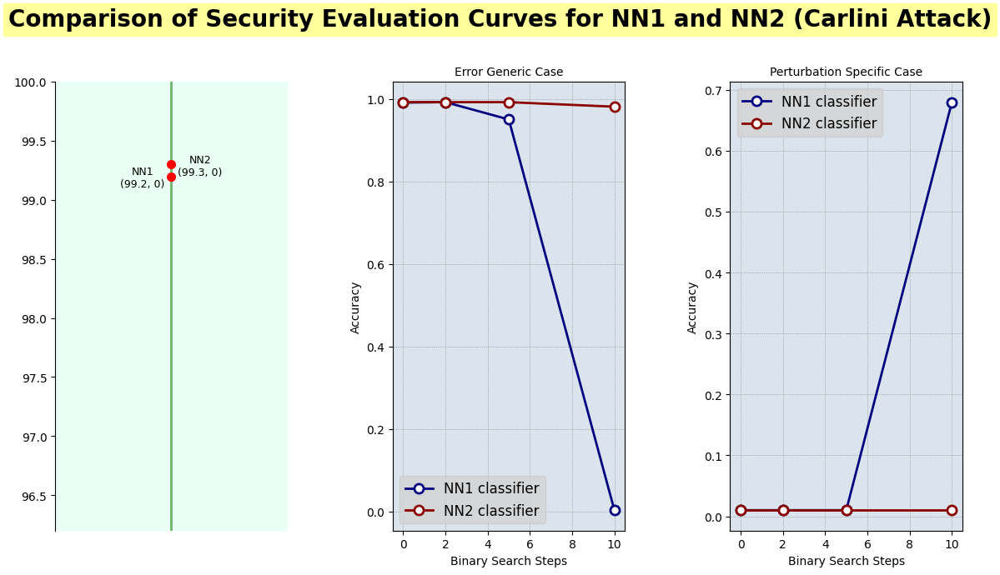

In [198]:
# Load the results from the file
nb_correct_nn1_g = [nb_correct_pred] + torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_g.pt')
nb_correct_nn2_g = torch.load('security_evaluation_curve/Carlini/nb_correct_nn2_g.pt')
nb_correct_nn1_s = [nb_correct_pred_target] + torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_s.pt')
nb_correct_nn2_s = torch.load('security_evaluation_curve/Carlini/nb_correct_nn2_s.pt')

# Compare the security evaluation curves for NN1 and NN2 (DeepFool Attack)
compare_sec(binary_search_steps, accuracy_nn1, accuracy_nn2, nb_correct_nn1_g, nb_correct_nn2_g, nb_correct_nn1_s, nb_correct_nn2_s, title='Comparison of Security Evaluation Curves for NN1 and NN2 (Carlini Attack)', x_axis_label='Binary Search Steps')

<a id="defence"></a>
# **7. Defense Mechanism Implementation 🛡️**

The objective of this section is to implement and evaluate the effectiveness of at least one defense mechanism against adversarial attacks in a face recognition access control system. This involves choosing between at least one of the two types of defense mechanisms: detectors of adversarial samples and pre-processing techniques. Specifically:

- **Pre-processing Techniques**: These methods involve modifying the input data in a way that neutralizes the adversarial perturbations. Common techniques include image transformation, noise reduction, and input sanitization, which aim to remove or mitigate the effects of adversarial alterations, thereby making the input data more robust against such attacks.
- **Detectors of Adversarial Samples**: These mechanisms aim to identify and filter out adversarial examples before they reach the face recognition model. They operate by analyzing the input data and distinguishing between normal and adversarial samples based on certain characteristics or patterns indicative of adversarial manipulation.

### **Pre-Processing**


[INFO] Accuracy of the model on the smoothed test set: 0.987                     
[INFO] Original test data (1000 images):        
 • Correctly classified: 987        
 • Incorrectly classified: 13        
 • Correctly classified as  Andrew_Lincoln: 10        
 • Incorrectly classified as  Andrew_Lincoln: 990


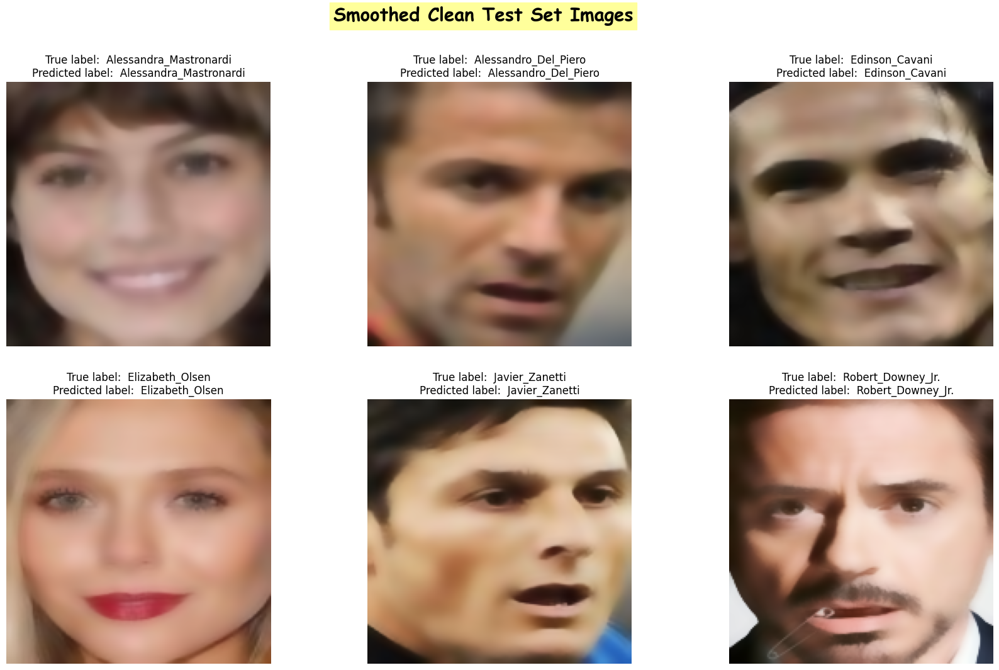

In [104]:
from attacks.preprocessing import ImageProcessor

# Initialize the ImageProcessor
ip = ImageProcessor()

# # Apply the SpatialSmoothing defence to the clean test set
x_test_smoothed = ip.apply_vectorized_function(x_test_aligned, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
dataloader_smoothed = DataLoader(TensorDataset(torch.tensor(x_test_smoothed), y_test_aligned), collate_fn=collate_fn)
dataloader_smoothed.dataset.idx_to_class = dataloader_aligned.dataset.idx_to_class

# Evaluate the accuracy of the model on the smoothed test set
y_true, y_pred_smoothed = evaluate_model(nn1, dataloader_smoothed, LABELS)

# Evaluate the accuracy of the model
accuracy_smoothed = accuracy_score(y_true, y_pred_smoothed)
logger.info("Accuracy of the model on the smoothed test set: {0}".format(accuracy_smoothed))

# Get the number of correctly classified images
nb_correct_pred_smoothed = np.sum(np.array(y_true) == np.array(y_pred_smoothed))
nb_correct_pred_smoothed_target = np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_pred_smoothed))
logger.info("Original test data (1000 images):\
        \n • Correctly classified: {0}\
        \n • Incorrectly classified: {1}\
        \n • Correctly classified as {2}: {3}\
        \n • Incorrectly classified as {4}: {5}".format(
            nb_correct_pred_smoothed, test_set_size - nb_correct_pred_smoothed,\
            LABELS[target_class], nb_correct_pred_smoothed_target,\
            LABELS[target_class], test_set_size - nb_correct_pred_smoothed_target
        )
)

# Plot the x_test_smoothed images
plot_predicted_images(x_test=x_test_smoothed, y_true=y_true, y_pred=y_pred_smoothed, title="Smoothed Clean Test Set Images")

#### FGSM

In [205]:
# Set the flag to False if the adversarial examples are already generated
fgsm_generate = False

# Stop the execution of the code if the adversarial examples are already generated (fgsm_generate = False)
if not fgsm_generate:
    raise SystemExit

# Epsilon Range for the FGSM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Smoothed FGSM Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = torch.load('attacks/FGSM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_fgsm = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_fgsm))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Smoothed FGSM Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the FGSM attack with the current epsilon value
    x_test_adv = torch.load('attacks/FGSM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_fgsm = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_fgsm))]
    # Save the perturbation for the current epsilon value
    perturbation_nn1_s += [np.mean(np.abs(x_test_adv - x_test_aligned))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred_smoothed] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_smoothed_target] + nb_correct_nn1_s
perturbation_nn1_g = [0] + perturbation_nn1_g
perturbation_nn1_s = [0] + perturbation_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/FGSM/smoothed/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/FGSM/smoothed/nb_correct_nn1_s.pt')
torch.save(perturbation_nn1_g, 'security_evaluation_curve/FGSM/smoothed/perturbation_nn1_g.pt')
torch.save(perturbation_nn1_s, 'security_evaluation_curve/FGSM/smoothed/perturbation_nn1_s.pt')

SystemExit: 

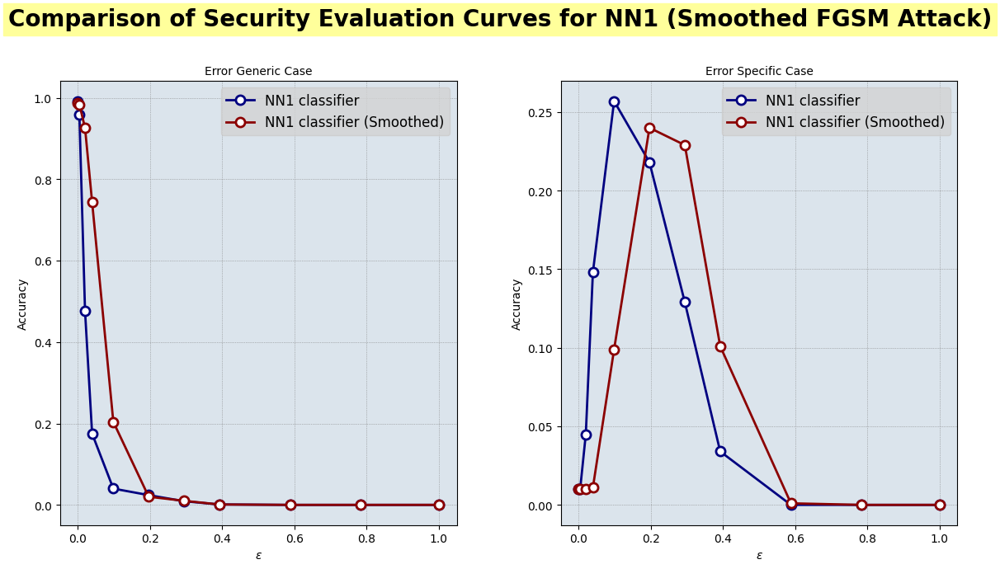

In [207]:
# Define the epsilon range for the FGSM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_g.pt')
nb_correct_nn1_g_smoothed = torch.load('security_evaluation_curve/FGSM/smoothed/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/FGSM/nb_correct_nn1_s.pt')
nb_correct_nn1_s_smoothed = torch.load('security_evaluation_curve/FGSM/smoothed/nb_correct_nn1_s.pt')

compare_sec_smoothed(eps_range, nb_correct_nn1_g, nb_correct_nn1_g_smoothed, nb_correct_nn1_s, nb_correct_nn1_s_smoothed, title='Comparison of Security Evaluation Curves for NN1 (Smoothed FGSM Attack)')

#### BIM

In [208]:
# Set the flag to False if the adversarial examples are already generated
bim_generate = False

# Stop the execution of the code if the adversarial examples are already generated (bim_generate = False)
if not bim_generate:
    raise SystemExit

# Epsilon Range for the BIM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

x_test_aligned = x_test_aligned.numpy() if isinstance(x_test_aligned, torch.Tensor) else x_test_aligned

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Smoothed BIM Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/BIM/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_bim))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Smoothed BIM Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the BIM attack with the current epsilon value
    x_test_adv = torch.load('attacks/BIM/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_bim = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_bim))]

# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred_smoothed] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_smoothed_target] + nb_correct_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/BIM/smoothed/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/BIM/smoothed/nb_correct_nn1_s.pt')

SystemExit: 

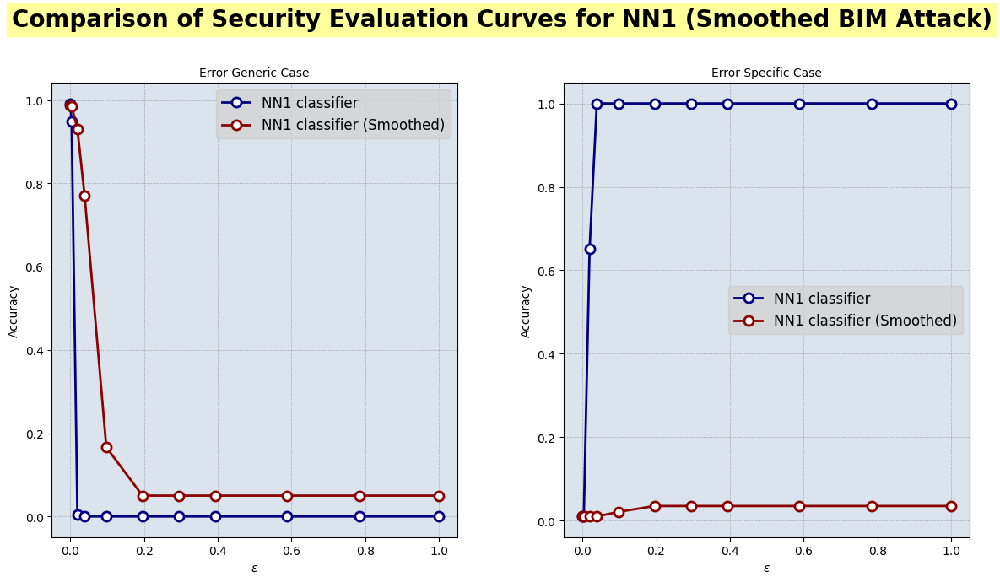

In [209]:
# Define the epsilon range for the BIM attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_g.pt')
nb_correct_nn1_g_smoothed = torch.load('security_evaluation_curve/BIM/smoothed/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/BIM/nb_correct_nn1_s.pt')
nb_correct_nn1_s_smoothed = torch.load('security_evaluation_curve/BIM/smoothed/nb_correct_nn1_s.pt')

compare_sec_smoothed(eps_range, nb_correct_nn1_g, nb_correct_nn1_g_smoothed, nb_correct_nn1_s, nb_correct_nn1_s_smoothed, title='Comparison of Security Evaluation Curves for NN1 (Smoothed BIM Attack)')

#### PGD

In [210]:
# Set the flag to False if the adversarial examples are already generated
pgd_generate = False

# Stop the execution of the code if the adversarial examples are already generated (pgd_generate = False)
if not pgd_generate:
    raise SystemExit

# Epsilon Range for the PGD attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Smoothed PGD Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = torch.load('attacks/PGD/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_pgd))]

# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Specific) Smoothed PGD Attack - Evaluating NN1 for each epsilon value", leave=False):
    # Generate adversarial examples using the PGD attack with the current epsilon value
    x_test_adv = torch.load('attacks/PGD/Specific/x_test_adv_nn1_s_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_pgd = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_pgd))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred_smoothed] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_smoothed_target] + nb_correct_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/PGD/smoothed/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/PGD/smoothed/nb_correct_nn1_s.pt')

SystemExit: 

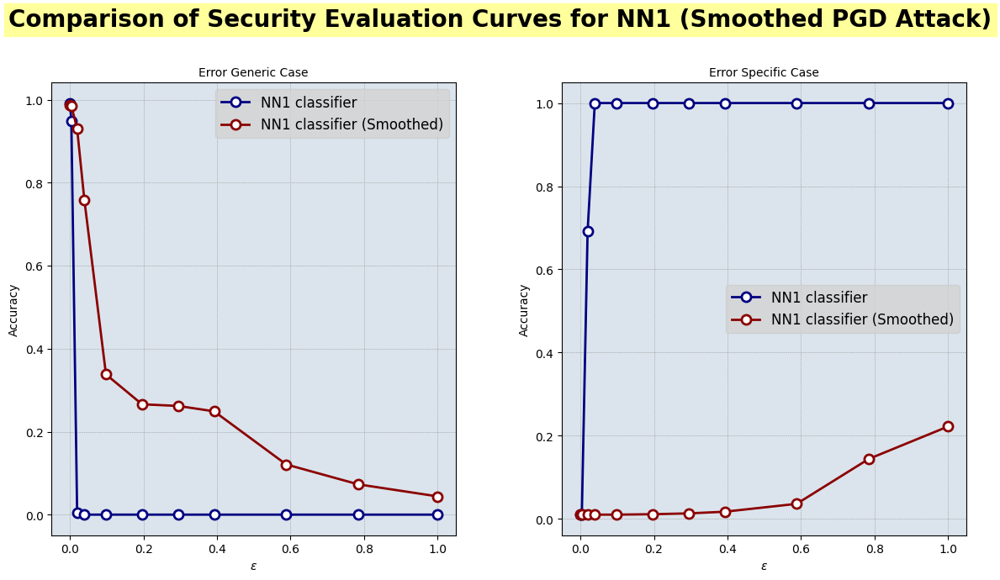

In [114]:
# Define the epsilon range for the PGD attack
eps_range = [0, 1/255, 5/255, 10/255, 25/255, 50/255, 75/255, 100/255, 150/255, 200/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_g.pt')
nb_correct_nn1_g_smoothed = torch.load('security_evaluation_curve/PGD/smoothed/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/PGD/nb_correct_nn1_s.pt')
nb_correct_nn1_s_smoothed = torch.load('security_evaluation_curve/PGD/smoothed/nb_correct_nn1_s.pt')

compare_sec_smoothed(eps_range, nb_correct_nn1_g, nb_correct_nn1_g_smoothed, nb_correct_nn1_s, nb_correct_nn1_s_smoothed, title='Comparison of Security Evaluation Curves for NN1 (Smoothed PGD Attack)')

#### DeepFool

In [211]:
# Set the flag to False if the adversarial examples are already generated
df_generate = False

# Stop the execution of the code if the adversarial examples are already generated (df_generate = False)
if not df_generate:
    raise SystemExit

# Epsilon Range for the DeepFool attack
eps_range = [0, 1/255, 10/255, 25/255, 100/255, 1]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()

# Evaluate the model for each epsilon value
for eps in tqdm(eps_range[1:], desc="(Error Generic) Smoothed DeepFool Attack - Evaluating NN1 for each epsilon value", leave=True):
    # Generate adversarial examples using the DeepFool attack with the current epsilon value
    x_test_adv = torch.load('attacks/DeepFool/Generic/x_test_adv_nn1_g_{0}.pt'.format(eps))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current epsilon value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current epsilon value
    y_test_adv_df = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current epsilon value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_df))]
    
# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred_smoothed] + nb_correct_nn1_g

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/DeepFool/smoothed/nb_correct_nn1_g.pt')

SystemExit: 

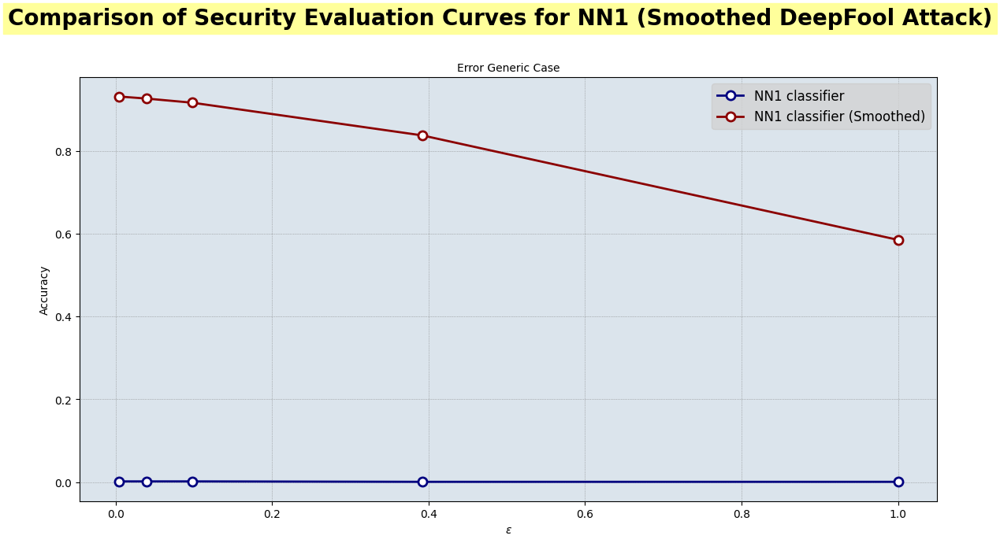

In [212]:
# Define the epsilon range for the DeepFool attack
eps_range = [0, 1/255, 10/255, 25/255, 100/255, 1]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/DeepFool/nb_correct_nn1_g.pt')
nb_correct_nn1_g_smoothed = torch.load('security_evaluation_curve/DeepFool/smoothed/nb_correct_nn1_g.pt')

compare_sec_smoothed(eps_range[1:], nb_correct_nn1_g, nb_correct_nn1_g_smoothed[1:], title='Comparison of Security Evaluation Curves for NN1 (Smoothed DeepFool Attack)')

#### Carlini

In [213]:
# Set the flag to False if the adversarial examples are already generated
carlini_generate = False

# Stop the execution of the code if the adversarial examples are already generated (carlini_generate = False)
if not carlini_generate:
    raise SystemExit

# Binary Search Steps Range for the Carlini attack
binary_search_steps = [0, 2, 5, 10]

# ERROR GENERIC CASE
# ------------------

# Initialize the list to store the number of correctly classified images
nb_correct_nn1_g = list()
perturbation_nn1_g = list()

# Evaluate the model for each binary_search_step value
for binary_search_step in tqdm(binary_search_steps[1:], desc='(Error Generic) Smoothed Carlini Attack - Evaluating NN1 for each binary search step value', leave=False):
    # Load adversarial examples generated using the Carlini attack with the current binary_search_step value
    x_test_adv = torch.load('attacks/Carlini/Generic/x_test_adv_nn1_g_{0}.pt'.format(binary_search_step))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current binary_search_step value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current binary_search_step value
    y_test_adv_cw = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current binary_search_step value
    nb_correct_nn1_g += [np.sum(np.array(y_true) == np.array(y_test_adv_cw))]
    
# ERROR SPECIFIC CASE
# -------------------

# Initialize the list to store the number of correctly classified images as the target class (Andrew Lincoln)
nb_correct_nn1_s = list()
perturbation_nn1_s = list()

# Evaluate the model for each binary_search_step value
for binary_search_step in tqdm(binary_search_steps[1:], desc='(Error Specific) Smoothed Carlini Attack - Evaluating NN1 for each binary search step value', leave=False):
    # Load adversarial examples generated using the Carlini attack with the current binary_search_step value
    x_test_adv = torch.load('attacks/Carlini/Specific/x_test_adv_nn1_s_{0}.pt'.format(binary_search_step))
    x_test_adv_smoothed = ip.apply_vectorized_function(x_test_adv, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
    # Predict the labels of the adversarial examples for the current binary_search_step value
    x_test_adv_pred = np.argmax(classifier.predict(x_test_adv_smoothed), axis=1)   
    # Get the predicted labels for the adversarial examples for the current binary_search_step value
    y_test_adv_cw = LABELS[x_test_adv_pred]
    # Count the number of correctly classified images for the current binary_search_step value
    nb_correct_nn1_s += [np.sum(np.tile(LABELS[target_class], test_set_size) == np.array(y_test_adv_cw))]

# Add the number of correctly classified images for the original test set
nb_correct_nn1_g = [nb_correct_pred_smoothed] + nb_correct_nn1_g
nb_correct_nn1_s = [nb_correct_pred_smoothed_target] + nb_correct_nn1_s

# Save the results into a file
torch.save(nb_correct_nn1_g, 'security_evaluation_curve/Carlini/smoothed/nb_correct_nn1_g.pt')
torch.save(nb_correct_nn1_s, 'security_evaluation_curve/Carlini/smoothed/nb_correct_nn1_s.pt')

SystemExit: 

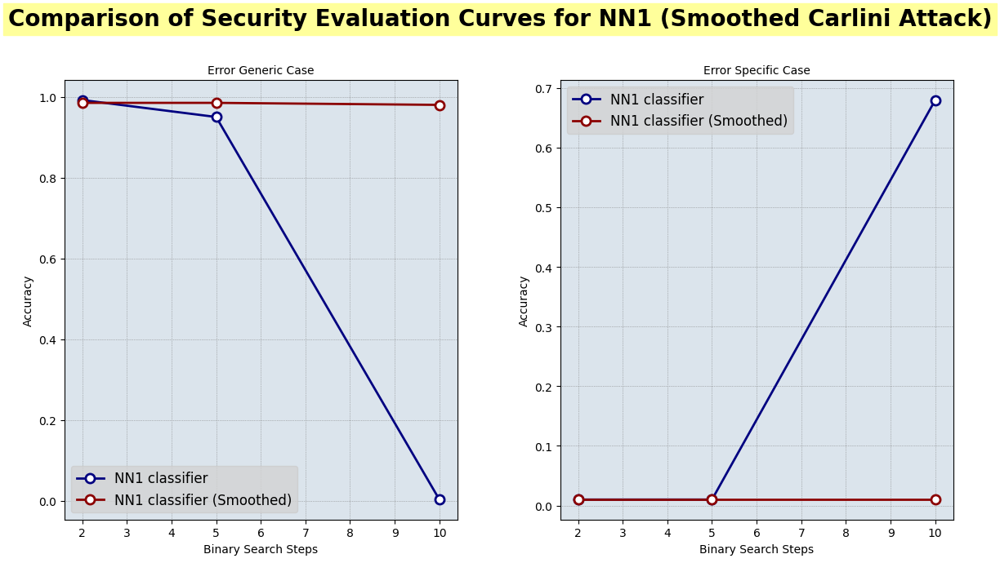

In [214]:
# Binary Search Steps Range for the Carlini attack
binary_search_steps = [0, 2, 5, 10]

# Load the results from the file
nb_correct_nn1_g = torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_g.pt')
nb_correct_nn1_g_smoothed = torch.load('security_evaluation_curve/Carlini/smoothed/nb_correct_nn1_g.pt')
nb_correct_nn1_s = torch.load('security_evaluation_curve/Carlini/nb_correct_nn1_s.pt')
nb_correct_nn1_s_smoothed = torch.load('security_evaluation_curve/Carlini/smoothed/nb_correct_nn1_s.pt')

compare_sec_smoothed(binary_search_steps[1:], nb_correct_nn1_g, nb_correct_nn1_g_smoothed[1:], nb_correct_nn1_s, nb_correct_nn1_s_smoothed[1:], title='Comparison of Security Evaluation Curves for NN1 (Smoothed Carlini Attack)', x_axis_label='Binary Search Steps')

### **Detecting Adversarial Image Examples in Deep Neural Networks with Adaptive Noise Reduction**

To address the challenges of detecting adversarial examples, B. Liang et al. [1] introduced a novel technique that effectively captures these examples even without prior knowledge of potential attacks. Their approach is based on the observation that to make adversarial changes imperceptible, the perturbation must be confined within a small range; otherwise, it would be easily detectable by humans. The image's entropy is utilized to measure the complexity of the samples.

An aggressive noise reduction strategy is employed for samples with low entropy, which are likely to be heavily perturbed by adversaries. Conversely, a light noise reduction strategy is used for high-entropy samples. Specifically the key component of their method is a detection filter $T$. When a sample $x$ is input into the target classifier $C$, it is first denoised by $T$ to produce a filtered sample $T(x)$. The sample is quantized with an appropriate interval size determined by its entropy. The entropy also decides whether the quantized sample requires smoothing. Only when the entropy exceeds a certain threshold will the sample be smoothed by a spatial smoothing filter.

Finally, two separate classifications are performed: one on the original sample $x$ and the other on the denoised sample $T(x)$. The sample $x$ is considered benign only if the classifications are identical: 

\begin{equation}C(x) = C(T(x)),\end{equation}

otherwise, it is identified as adversarial. In practice, the detection mechanism cannot know the true class of $x$ in advance to validate its current classification $C(x)$. In this method, $C(T(x))$ acts as a baseline to detect potential adversarial examples.

> [1] B. Liang, H. Li, M. Su, X. Li, W. Shi, and X. Wang, "Detecting Adversarial Image Examples in Deep Neural Networks with Adaptive Noise Reduction," in IEEE Transactions on Dependable and Secure Computing, vol. 18, no. 1, pp. 72-85, Jan.-Feb. 2021, doi: 10.1109/TDSC.2018.2874243. Keywords: Perturbation methods, Noise reduction, Entropy, Training, Neural networks, Smoothing methods, Image processing, Adversarial example, deep neural network, detection. [https://doi.org/10.48550/arXiv.1705.08378](https://doi.org/10.48550/arXiv.1705.08378)

In [215]:
import numpy as np
import math

def normalization(image_data):
    image_data[image_data < -0.5] = -0.5
    image_data[image_data > 0.5] = 0.5

def calculate_entropy(image: np.ndarray) -> float:
    '''This function calculates the entropy of the input image. The entropy is a measure of the uncertainty or
    randomness in the pixel values of the images. More entropy indicates more randomness in the pixel values.

    Parameters
    ----------
    image : np.ndarray
        The input image for which to calculate entropy.

    Returns
    -------
    float
        The average entropy of the image.
    '''
        
    expandDigit = np.array((image + 1.0) * 127.5, dtype=np.int16) if image.min() < 0 else np.array(image * 255, dtype=np.int16)
    f1 = np.zeros(256)
    f2 = np.zeros(256)
    f3 = np.zeros(256)
    
    expandDigit = expandDigit.transpose(1, 2, 0)
    
    for i in range(160):
        for j in range(160):
            f1[expandDigit[i][j][0]] += 1
            f2[expandDigit[i][j][1]] += 1
            f3[expandDigit[i][j][2]] += 1
            
    total_pixels = 160 * 160
    
    f1 /= total_pixels
    f2 /= total_pixels
    f3 /= total_pixels
    
    H1 = 0
    H2 = 0
    H3 = 0
    
    for i in range(256):
        if f1[i] > 0:
            H1 += f1[i] * math.log(f1[i], 2)
        if f2[i] > 0:
            H2 += f2[i] * math.log(f2[i], 2)
        if f3[i] > 0:
            H3 += f3[i] * math.log(f3[i], 2)
    
    average_entropy = -(H1 + H2 + H3) / 3.0
    
    return average_entropy

def scalar_quantization(image: np.ndarray, interval: int) -> np.ndarray:
    '''Applies scalar quantization to an image in the range [-1, 1].

    Parameters
    ----------
    image : np.ndarray
        The input image to be quantized.
    interval : int
        The quantization interval.

    Returns
    -------
    np.ndarray
        The scalar-quantized image.
    '''
    # Convert the image to the range [0, 255]
    quantized_image = (image + 1.0) * 127.5 if image.min() < 0 else image * 255
    
    # Perform scalar quantization
    quantized_image = (quantized_image // interval) * interval
    
    # Convert the image back to the range [-1, 1]
    quantized_image = (quantized_image / 127.5) - 1.0 if image.min() < 0 else quantized_image / 255
    
    return quantized_image

######

Creating a dataset containing adversarial and cleaned examples (50% Clean, 50% Adversarial (12% FGSM, 12% BIM, 12% PGD, 7% DeepFool, 7% Carlini))


In [216]:
# Load original test set
x_test_aligned_clean = torch.tensor(x_test_aligned.copy())

# Load the adversarial examples generated using the FGSM attack
x_test_adv_fgsm = torch.load('attacks/FGSM/Generic/x_test_adv_nn1_g_{}.pt'.format(100/255))
# Load the adversarial examples generated using the BIM attack
x_test_adv_bim = torch.load('attacks/BIM/Generic/x_test_adv_nn1_g_{}.pt'.format(100/255))
# Load the adversarial examples generated using the PGD attack
x_test_adv_pgd = torch.load('attacks/PGD/Generic/x_test_adv_nn1_g_{}.pt'.format(100/255))
# Load the adversarial examples generated using the DeepFool attack
x_test_adv_df = torch.load('attacks/DeepFool/Generic/x_test_adv_nn1_g_{}.pt'.format(100/255))
# Load the adversarial examples generated using the Carlini attack
x_test_adv_cw = torch.load('attacks/Carlini/Generic/x_test_adv_nn1_g_{}.pt'.format(10))

In [217]:
# Create a new dataset containing adversarial and cleaned examples
x_mixed_tensor = torch.tensor(np.concatenate((
    (x_test_aligned_clean[0:500] + 1) / 2, 
    (x_test_adv_fgsm[500:620] + 1) / 2, 
    (x_test_adv_bim[620:740] + 1) / 2,
    (x_test_adv_pgd[740:860] + 1) / 2,
    (x_test_adv_df[860:930] + 1) / 2,
    (x_test_adv_cw[930:1000] + 1) / 2
), axis=0))
y_mixed_tensor = torch.tensor(y_test_aligned)

dataloader_mixed = DataLoader(TensorDataset(x_mixed_tensor, y_mixed_tensor), collate_fn=collate_fn)
dataloader_mixed.dataset.idx_to_class = dataloader_aligned.dataset.idx_to_class

In [218]:
y_true, y_pred = evaluate_model(nn1, dataloader_mixed, LABELS)

# Evaluate the accuracy of the model
accuracy_mixed = accuracy_score(y_true, y_pred)
logger.info("Accuracy of the model on the mixed test set: {0}".format(accuracy_mixed))

Evaluating the model:   0%|          | 0/1000 [00:00<?, ?it/s]

[INFO] Accuracy of the model on the mixed test set: 0.569                


Evaluating the model:   0%|          | 0/1000 [00:00<?, ?it/s]

[INFO] Accuracy of the model to detect clean and adversarial examples: 0.869


<Axes: >

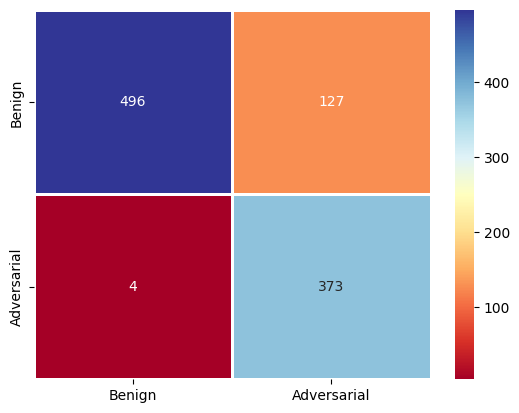

In [219]:
import seaborn as sns

# Evaluate the model to detect clean and adversarial examples
model = nn1.eval().to(device)

# Initialize the variables
y_true_list = list()
y_pred_list = list()

# Iterate over the test set
with torch.no_grad():
    TP = 0
    TN = 0
    FP = 0
    FN = 0
    ACC = 0
        
    for index, sample in tqdm(enumerate(dataloader_mixed), total=len(dataloader_mixed), desc='Evaluating the model', leave=False):
        # Get image and label from the sample
        image, label = sample[0].to(device), sample[1].to(device)
        
        # Predicted output from the model
        image = torch.unsqueeze(image, 0) if len(image.shape) == 3 else image
        output = model(image).cpu()
        pred_class = int(torch.argmax(output, dim=1).item())
    
        # Append true and predicted labels to the lists
        y_true = dataloader_mixed.dataset.idx_to_class[label.item()]
        y_pred = LABELS[pred_class]
        
        y_true_list.append(y_true)
        y_pred_list.append(y_pred)
        
        # Remove the batch dimension        
        image = torch.squeeze(image, 0)
        
        
        # Compute the entropy of the image
        entropy = calculate_entropy(image.cpu().numpy())
        
        if entropy < 7.0:
            quantized_image = scalar_quantization(image.cpu().numpy(), 16)
            smoothed_image = quantized_image
        else:
            quantized_image = scalar_quantization(image.cpu().numpy(), 8)
            smoothed_image = ip.apply_vectorized_function(quantized_image, ip.bilateral_filter, d=11, sigmaColor=150, sigmaSpace=150)
        
        smoothed_image = torch.unsqueeze(torch.tensor(smoothed_image).to(device), 0) if len(smoothed_image.shape) == 3 else torch.tensor(smoothed_image).to(device)
        # Predict the label of the smoothed image
        smoothed_output = model(torch.tensor(smoothed_image).to(device)).cpu()
        smoothed_pred_class = int(torch.argmax(smoothed_output, dim=1).item())
        
        # Get the predicted label
        smoothed_pred = LABELS[smoothed_pred_class]
        
        if y_pred == smoothed_pred:
            if index < 500:
                TP += 1
            else:
                FP += 1
            
        else:
            if index < 500:
                FN += 1
            else:
                TN += 1

    ACC = (TP + TN) / (TP + TN + FP + FN)

logger.info('Accuracy of the model to detect clean and adversarial examples: {0}'.format(ACC))

# Compute the confusion matrix from TP, TN, FP, FN
conf_matrix = np.array([[TP, FP], [FN, TN]])

# Plot the confusion matrix using a heatmap
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='RdYlBu', xticklabels=['Benign', 'Adversarial'], yticklabels=['Benign', 'Adversarial'], linecolor='white', linewidth=.75)